



---


---

# **Portfolio Selection Using Machine Learning Techniques**
---



---



**Made By:**

* **Riechie (01112210038)**
* **Ferell Aaron Wirjanto (01112210025)**
* **Ryuki Ranawidjaja (01112210032)**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **I. Data Preparation**


---


---





In [ ]:
import pandas as pd
import numpy as np
import yfinance as yf
import matplotlib.pyplot as plt
import plotly.express as px

In [ ]:
tkr = ["ACES.JK" ,"ADRO.JK" ,"AKRA.JK" ,"ANTM.JK" ,"ASII.JK" ,"BBCA.JK" ,
       "BBNI.JK" ,"BBRI.JK" ,"BBTN.JK" ,"BMRI.JK" ,"BRPT.JK" ,"BSDE.JK" ,
       "CPIN.JK" ,"EXCL.JK" ,"GGRM.JK" ,"HMSP.JK" ,"ICBP.JK" ,
       "INCO.JK" ,"INDF.JK" ,"INKP.JK" ,"INTP.JK" ,"ITMG.JK" ,"JPFA.JK" ,
       "JSMR.JK" ,"KLBF.JK" ,"MEDC.JK" ,"MNCN.JK" ,
       "PGAS.JK" ,"PTBA.JK" ,"PWON.JK" ,"SMGR.JK" ,"SMRA.JK" ,
       "TINS.JK" ,"TKIM.JK" ,"TLKM.JK" ,"TPIA.JK" ,
       "UNTR.JK" ,"UNVR.JK" ,"WIKA.JK" ,"CTRA.JK" ,"SCMA.JK" ,
       "LPPF.JK" ,"INDY.JK" ,"ADHI.JK" ,"ELSA.JK" ,
       "BKSL.JK" ,"LPKR.JK" ,"BMTR.JK" ,
       "BUMI.JK" ,"MYRX.JK" ,"TRAM.JK" ,"AALI.JK" ,"LSIP.JK" ,
       "ASRI.JK" ,"MPPA.JK" ,"BDMN.JK" ,
       "MAIN.JK" ,"MLPL.JK" ,"SSIA.JK" ,
       "BHIT.JK" ,"BWPT.JK" ,"IMAS.JK" ,"MAPI.JK" ,"SMCB.JK" ,
       "ELTY.JK" ,"ENRG.JK" ,"INTA.JK" ,"KIJA.JK" ,"DOID.JK" ,
       "GJTL.JK" ,"UNSP.JK" ,"BNBR.JK" ,
       "ISAT.JK" ,"BBKP.JK" ,"BTEL.JK" ,"DEWA.JK" ,
       "BISI.JK" ,"BLTA.JK" ,"HEXA.JK" ,"MIRA.JK" ,"SGRO.JK" ,
       "ERAA.JK", "TBIG.JK", "TOWR.JK", "WSKT.JK" , "BJBR.JK", "HRUM.JK",
       "TAXI.JK", "VIVA.JK", "GIAA.JK", "KRAS.JK" ,"SIMP.JK"]
data = yf.download(tkr, start = '2015-01-01', end = '2023-12-31', interval = '1wk')
data = data['Adj Close']

[*********************100%%**********************]  92 of 92 completed


In [ ]:
data

Ticker,AALI.JK,ACES.JK,ADHI.JK,ADRO.JK,AKRA.JK,ANTM.JK,ASII.JK,ASRI.JK,BBCA.JK,BBKP.JK,...,TLKM.JK,TOWR.JK,TPIA.JK,TRAM.JK,UNSP.JK,UNTR.JK,UNVR.JK,VIVA.JK,WIKA.JK,WSKT.JK
Date,,,,,,,,,,,,,,,,,,,,,
2014-12-29,17935.904297,638.227783,2504.835449,491.931488,631.310120,805.251587,5282.287598,570.286682,2249.177979,454.528900,...,2249.593994,657.883667,136.136017,204.475784,500.0,9767.818359,5179.482422,468.0,3072.664551,1291.164551
2015-01-05,18957.681641,638.227783,2494.325684,480.695435,646.040710,836.074646,5014.604004,580.119202,2198.157471,451.478424,...,2249.593994,657.883667,136.136017,275.218597,500.0,9654.895508,5290.955078,442.0,3072.664551,1260.317749
2015-01-12,18045.378906,560.494873,2427.763428,447.214020,643.936279,812.957397,5210.904297,565.370361,2202.408936,457.579468,...,2237.795166,661.164978,136.136017,197.692230,500.0,9739.587891,5334.747559,431.0,2980.693604,1273.537720
2015-01-19,17516.240234,630.045349,2585.410645,478.303833,625.698608,816.810242,5764.116211,594.867981,2266.185059,463.680481,...,2273.190674,661.164978,136.136017,110.475075,500.0,10092.472656,5764.712402,450.0,3055.942627,1401.332275
2015-01-26,16968.861328,605.498108,2588.913574,478.303833,658.666870,820.663086,5603.506836,585.035400,2274.688721,469.781616,...,2225.996582,641.477600,136.136017,127.918503,500.0,10106.587891,5704.994629,440.0,3131.191650,1511.499756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-27,7283.034668,735.000000,382.000000,2361.570312,1435.000000,1705.000000,5750.000000,168.000000,8706.860352,81.000000,...,3830.000000,934.360046,2910.000000,50.000000,109.0,22148.548828,3567.000000,50.0,384.000000,202.000000
2023-12-04,6893.307129,695.000000,350.000000,2361.570312,1395.000000,1685.000000,5675.000000,165.000000,8512.293945,81.000000,...,3940.000000,899.570007,4700.000000,50.000000,111.0,22298.539062,3449.082520,50.0,316.000000,202.000000
2023-12-11,6868.949219,685.000000,340.000000,2324.670654,1465.000000,1670.000000,5650.000000,162.000000,9017.208984,82.000000,...,3980.000000,994.000000,4930.000000,50.000000,111.0,21273.605469,3500.000000,50.0,240.000000,202.000000


In [ ]:
len(data)

470

In [ ]:
data.shape

(470, 92)

In [ ]:
data.isnull().sum().sum()

0

In [ ]:
# column_names = []
# for i in range(0,data.shape[1]):
#   if (data.iloc[:,i].isnull().sum() != 0):
#     column_names.append(data.iloc[:,i].name)
# column_names

In [ ]:
# fig = px.line(data, y = column_names)
# fig.show()

In [ ]:
# data.dropna(axis = 1, inplace = True)
# data.isnull().sum().sum()

In [ ]:
# print(data.shape)
# data

In [ ]:
fig = px.line(data)
fig.show()

# **II. Cluster -> Predict**

---



---



## **Stock Clustering Using Dynamic Time Warping**

---



In [ ]:
# !pip install tslearn

In [ ]:
%matplotlib inline
from tslearn.clustering import silhouette_score
from sklearn.decomposition import PCA

plt.rcParams['figure.figsize'] = [25, 8]

from tslearn.clustering import TimeSeriesKMeans
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

In [ ]:
seed = 0
np.random.seed(seed)
data_new = data.transpose().to_numpy()
data_train = TimeSeriesScalerMeanVariance().fit_transform(data_new)
sz = data_train.shape[1]

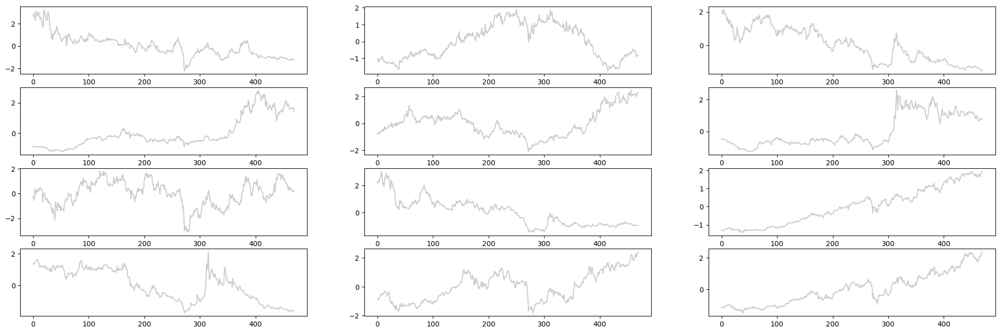

In [ ]:
for yi in range(12):
    plt.subplot(4, 3, yi + 1)
    plt.plot(data_train[yi].ravel(), "k-", alpha=.2)

### Determine Number of Clusters

Elbow Point

In [ ]:
Sum_of_squared_distances = []
K = range(2,16)
for k in K:
  print("--------------- Calculating for K = " + str(k) + " ---------------")
  km = TimeSeriesKMeans(n_clusters=k,
                        n_init=2,
                        metric="dtw",
                        verbose=False,
                        max_iter_barycenter=10,
                        random_state=0)

  km = km.fit(data_train)
  Sum_of_squared_distances.append(km.inertia_)

--------------- Calculating for K = 2 ---------------


KeyboardInterrupt: 

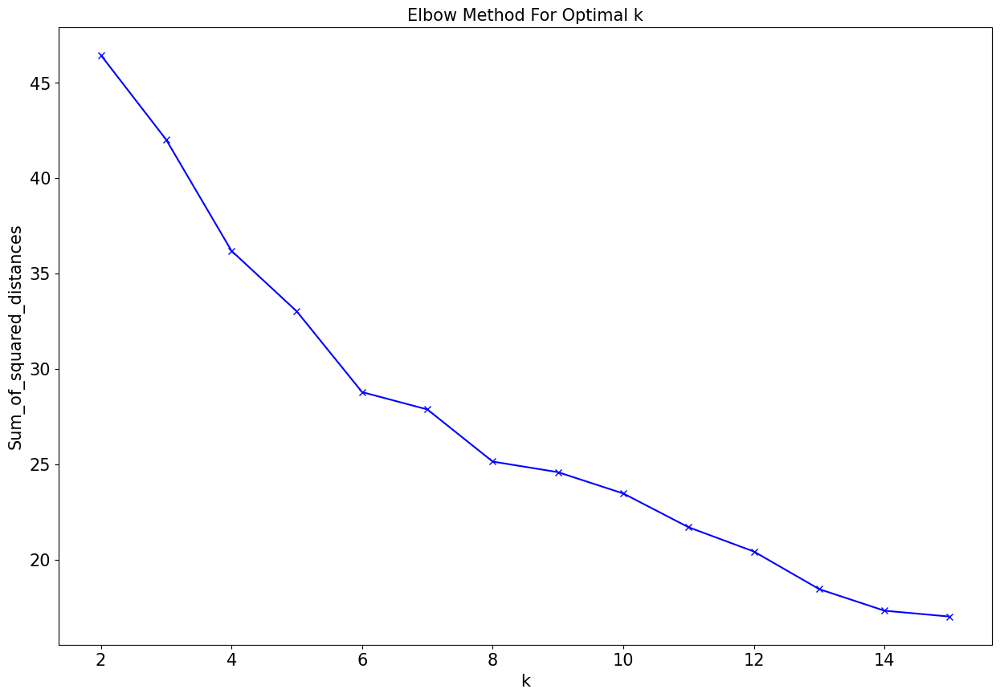

In [ ]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(15,10))
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k', fontsize = 15)
plt.ylabel('Sum_of_squared_distances', fontsize = 15)
plt.title('Elbow Method For Optimal k', fontsize = 15)
plt.show()

Silhouette Score

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import matplotlib.cm as cm

For n_clusters = 2 The average silhouette_score is : 0.50
For n_clusters = 3 The average silhouette_score is : 0.34
For n_clusters = 4 The average silhouette_score is : 0.25
For n_clusters = 5 The average silhouette_score is : 0.19
For n_clusters = 6 The average silhouette_score is : 0.07
For n_clusters = 7 The average silhouette_score is : 0.11
For n_clusters = 8 The average silhouette_score is : 0.10
For n_clusters = 9 The average silhouette_score is : 0.11
For n_clusters = 10 The average silhouette_score is : 0.09
For n_clusters = 11 The average silhouette_score is : 0.09
For n_clusters = 12 The average silhouette_score is : 0.08
For n_clusters = 13 The average silhouette_score is : 0.06
For n_clusters = 14 The average silhouette_score is : 0.10
For n_clusters = 15 The average silhouette_score is : 0.10
For n_clusters = 16 The average silhouette_score is : 0.05
For n_clusters = 17 The average silhouette_score is : 0.07
For n_clusters = 18 The average silhouette_score is : 0.07
For n

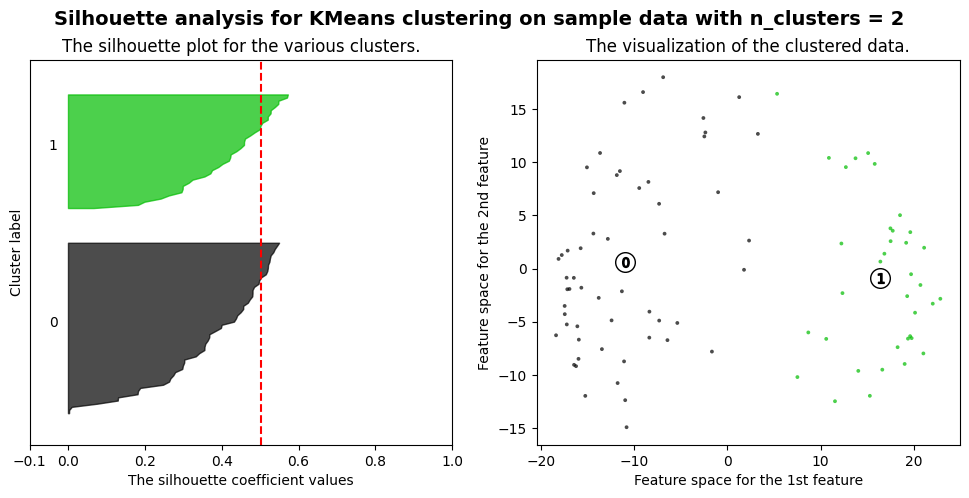

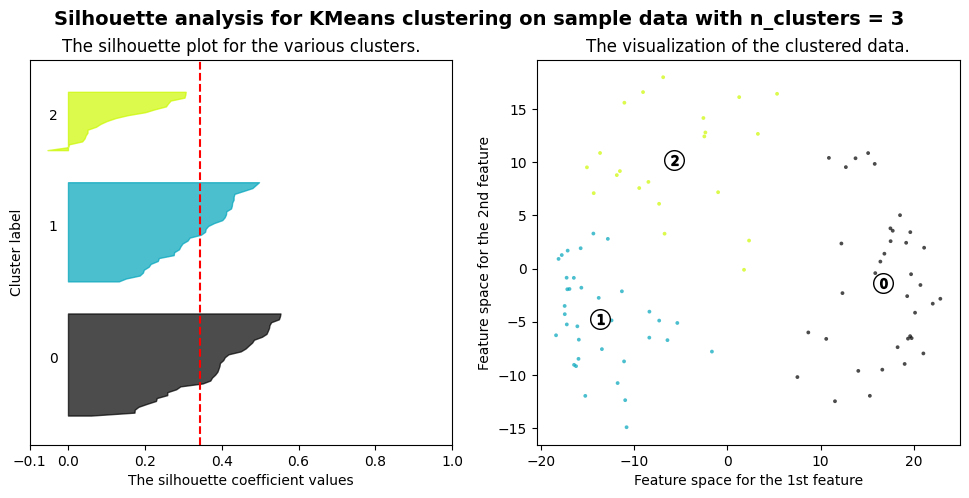

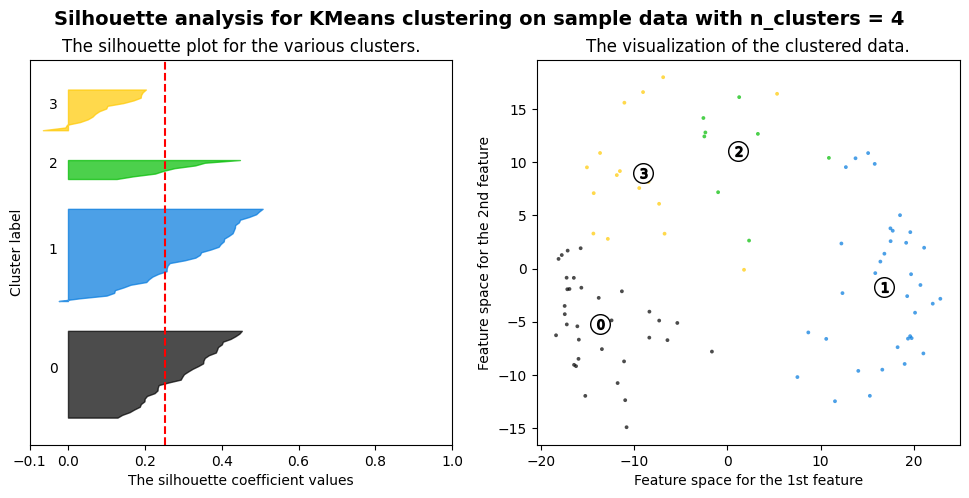

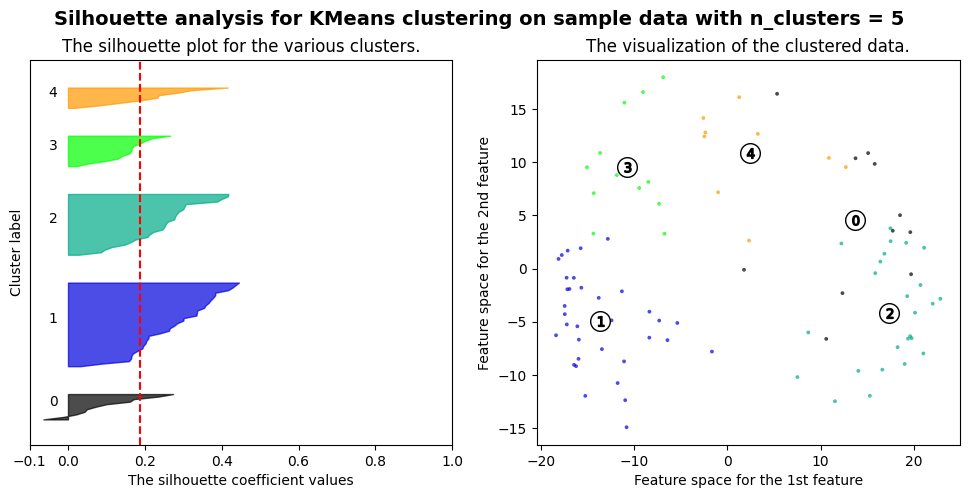

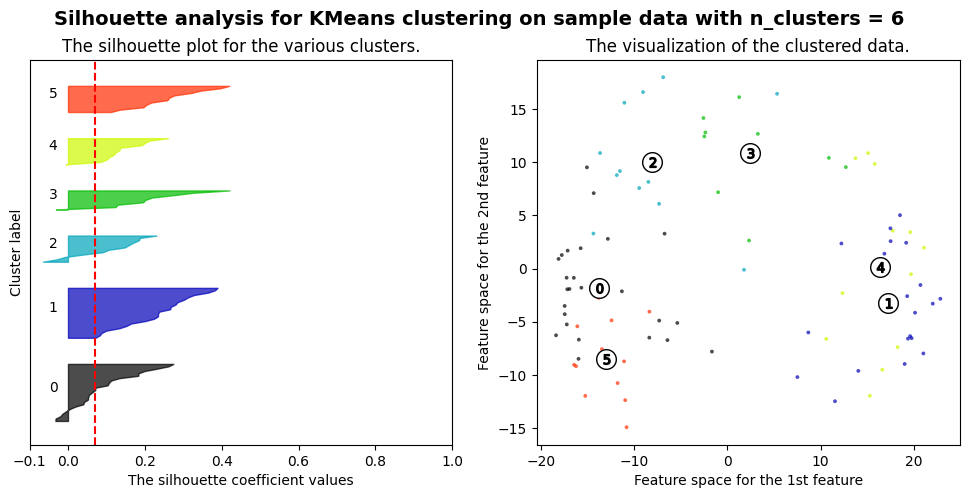

...

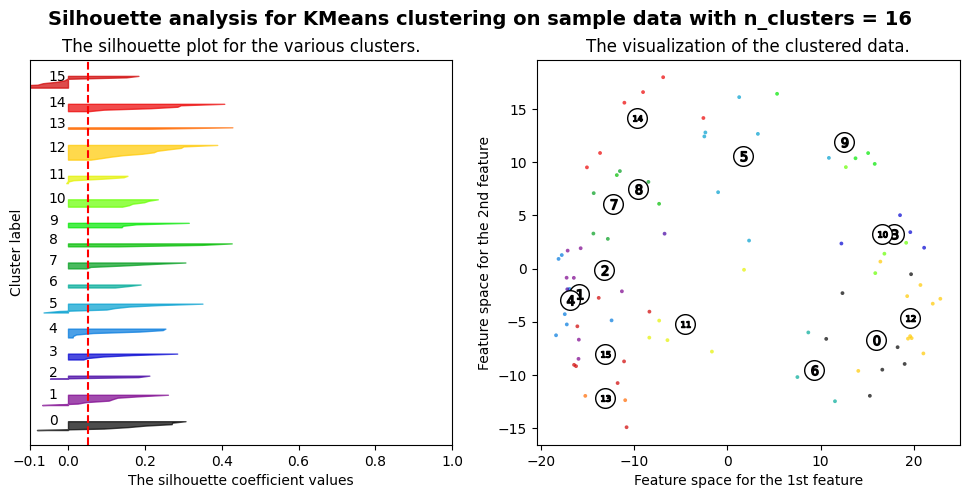

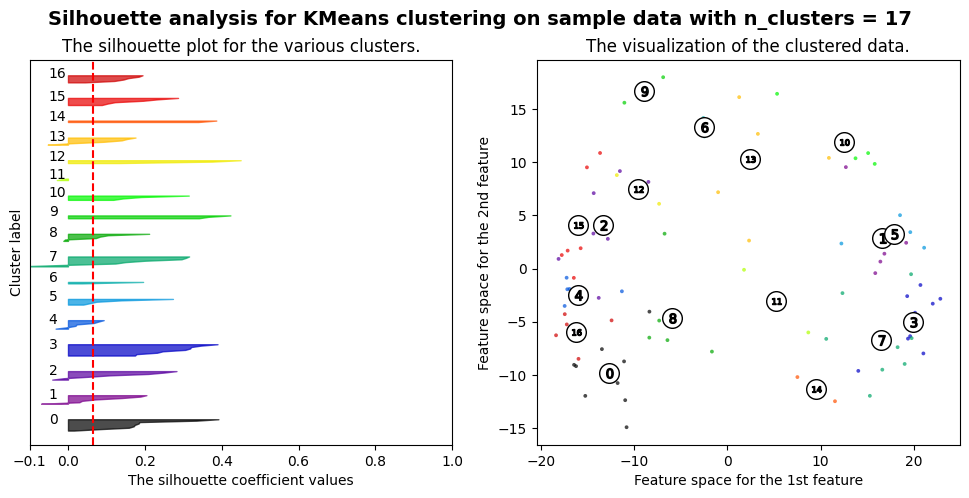

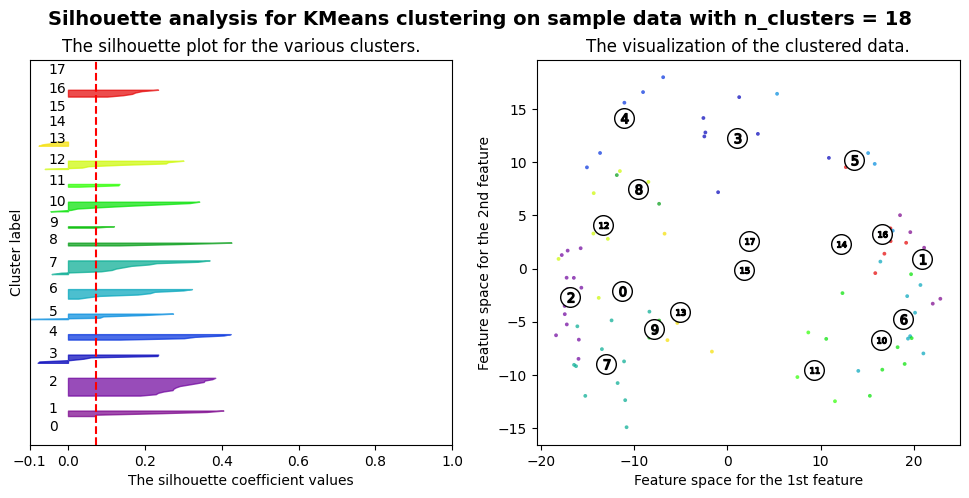

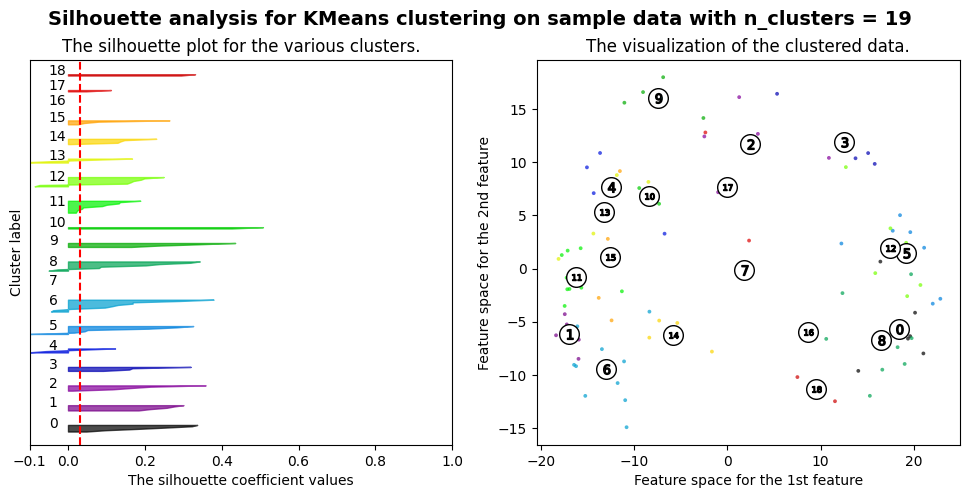

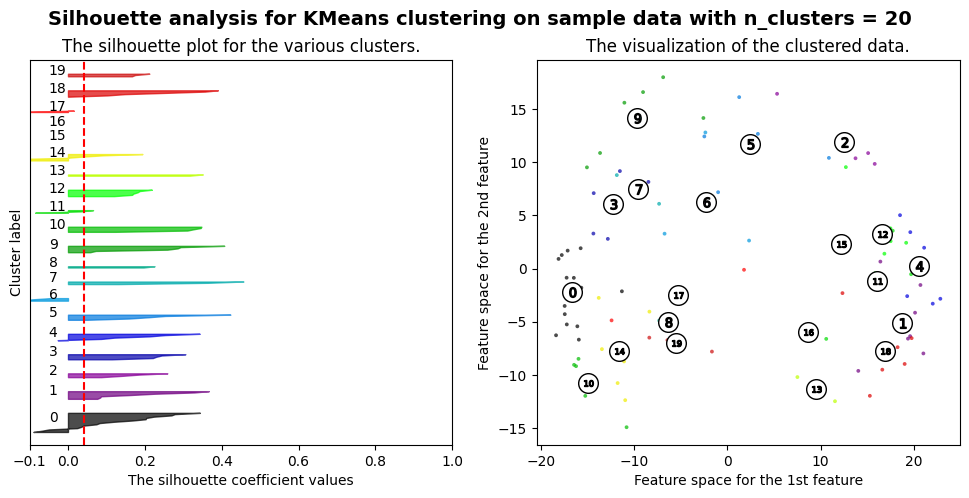

In [ ]:
train_pca = list(data_train.reshape(data_train.shape[0], data_train.shape[1]))
pca = PCA(n_components=0.95)
train_pca = pca.fit_transform(train_pca)

X = train_pca

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0, n_init = 10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is : {:.2f}"
        .format(silhouette_avg),
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()


        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()


### Clustering Result

DBA k-means
DBA silhoutte: 0.19


<ipython-input-23-c0fbcf592c17>:14: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



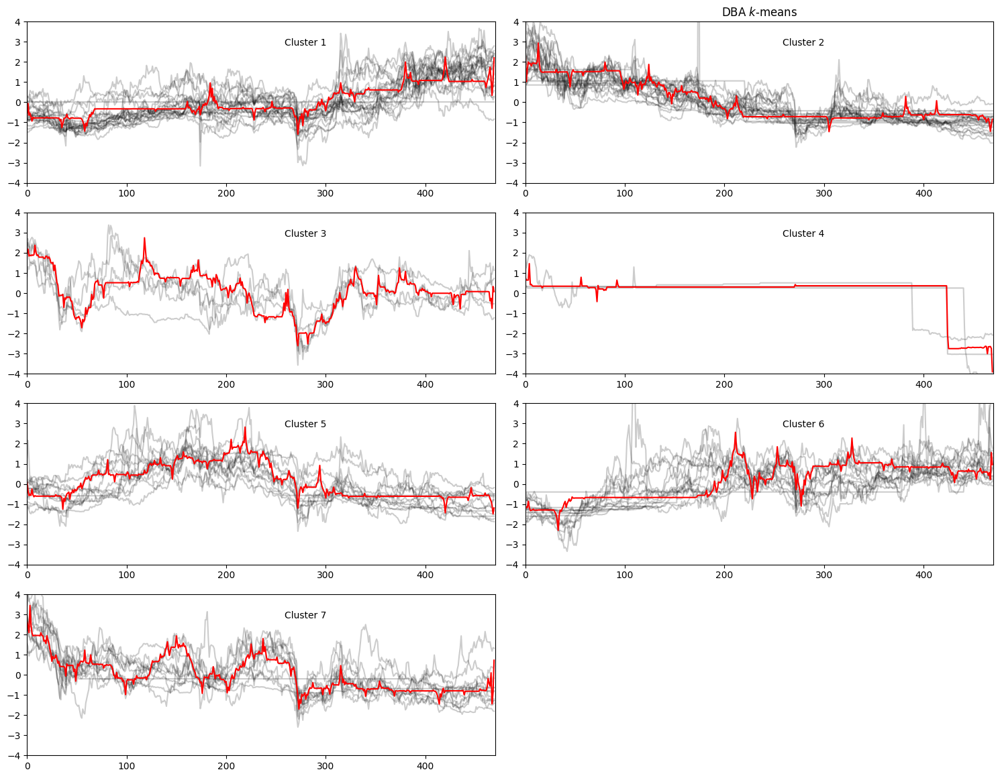

In [ ]:
n_clusters = 7
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                          n_init=2,
                          metric="dtw",
                          verbose=False,
                          max_iter_barycenter=10,
                          random_state=seed)
y_pred_dba_km = dba_km.fit_predict(data_train)
print("DBA silhoutte: {:.2f}".format(silhouette_score(data_train, y_pred_dba_km, metric="dtw")))

fig, size = plt.subplots(figsize=(15, 20))
for yi in range(n_clusters):
    plt.subplot(n_clusters, 2, yi+1)
    for xx in data_train[y_pred_dba_km == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")



plt.tight_layout()
plt.show()

In [ ]:
Cluster = []
for i in range (0,n_clusters):
  Clusters = []
  Cluster.append(Clusters)

for i in range(0,data.shape[1]):
  Cluster[y_pred_dba_km[i]].append(data.iloc[:,i].name)

for i in range(0, n_clusters):
  print('Cluster ' + str(i+1) + ': ' + ', '.join(Cluster[i]))

Cluster 1: ADRO.JK, AKRA.JK, ANTM.JK, ASII.JK, BBCA.JK, BBNI.JK, BBRI.JK, BMRI.JK, BTEL.JK, HEXA.JK, HRUM.JK, INCO.JK, ISAT.JK, ITMG.JK, KLBF.JK, MAPI.JK, MEDC.JK, PTBA.JK, TBIG.JK, TINS.JK, TOWR.JK, UNTR.JK
Cluster 2: AALI.JK, ADHI.JK, ASRI.JK, BBKP.JK, BHIT.JK, BLTA.JK, BMTR.JK, BSDE.JK, BWPT.JK, ELTY.JK, ENRG.JK, LPKR.JK, LPPF.JK, MNCN.JK, MPPA.JK, MYRX.JK, SCMA.JK, SMRA.JK, TAXI.JK, UNSP.JK, VIVA.JK, WIKA.JK
Cluster 3: CTRA.JK, GJTL.JK, LSIP.JK, SIMP.JK, SMCB.JK
Cluster 4: BNBR.JK, MAIN.JK, MIRA.JK
Cluster 5: ACES.JK, BBTN.JK, BDMN.JK, BUMI.JK, DOID.JK, GGRM.JK, HMSP.JK, INTA.JK, KRAS.JK, PWON.JK, TRAM.JK, UNVR.JK, WSKT.JK
Cluster 6: BISI.JK, BJBR.JK, BRPT.JK, CPIN.JK, DEWA.JK, ERAA.JK, ICBP.JK, INDF.JK, INDY.JK, INKP.JK, JPFA.JK, SGRO.JK, TKIM.JK, TLKM.JK, TPIA.JK
Cluster 7: BKSL.JK, ELSA.JK, EXCL.JK, GIAA.JK, IMAS.JK, INTP.JK, JSMR.JK, KIJA.JK, MLPL.JK, PGAS.JK, SMGR.JK, SSIA.JK


In [ ]:
for i in range(0, n_clusters):
  fig = px.line(data, x = data.index, y = Cluster[i])
  fig.update_layout(title_text = "Cluster "+ str(i+1))
  fig.show()

### Sharpe Ratio

In [ ]:
# returns = pd.DataFrame()
# returns = 100 * (np.log(data) - np.log(data.shift(1)))
# returns.dropna(inplace = True)
# volatility = returns.rolling(window=10).std()
# volatility.dropna(inplace = True)
# volatility

In [ ]:
risk_free_rate = 0.06/52
weekly_returns = data.pct_change()
weekly_returns.dropna(inplace = True)
avg_weekly_returns = weekly_returns.mean()
std_weekly_returns = weekly_returns.std()
sharpe_ratio = (avg_weekly_returns - risk_free_rate) / std_weekly_returns

In [ ]:
sharpe_ratio.to_frame()

,0
Ticker,
AALI.JK,-0.036201
ACES.JK,0.010484
ADHI.JK,-0.051370
ADRO.JK,0.063452
AKRA.JK,0.038360
...,...
UNTR.JK,0.037251
UNVR.JK,-0.030954
VIVA.JK,-0.070981


In [ ]:
# sr_df = sharpe_ratio[Cluster[0]].to_frame().transpose()
# sr_df

In [ ]:
portfolio = []
for i in range(0, n_clusters):
  portfolio.append(str(sharpe_ratio[Cluster[i]].idxmax()))
  print("Cluster "+str(i+1)+": Stock with the highest Sharpe Ratio is " + str(sharpe_ratio[Cluster[i]].idxmax()) + " with value of " + str(max(sharpe_ratio[Cluster[i]])))

Cluster 1: Stock with the highest Sharpe Ratio is HEXA.JK with value of 0.07930578801987918
Cluster 2: Stock with the highest Sharpe Ratio is ELTY.JK with value of 0.03452603898315692
Cluster 3: Stock with the highest Sharpe Ratio is CTRA.JK with value of 0.012405997974846447
Cluster 4: Stock with the highest Sharpe Ratio is MAIN.JK with value of -0.07220267424252781
Cluster 5: Stock with the highest Sharpe Ratio is DOID.JK with value of 0.045017370001161794
Cluster 6: Stock with the highest Sharpe Ratio is TPIA.JK with value of 0.1400979077960091
Cluster 7: Stock with the highest Sharpe Ratio is ELSA.JK with value of 0.007925361760318186


In [ ]:
portfolio = ['HEXA.JK', 'ELTY.JK', 'CTRA.JK', 'MAIN.JK', 'DOID.JK', 'TPIA.JK', 'ELSA.JK']

In [ ]:
print("The selected portfolio consists of "+', '.join(portfolio))

The selected portfolio consists of HEXA.JK, ELTY.JK, CTRA.JK, MAIN.JK, DOID.JK, TPIA.JK, ELSA.JK


In [ ]:
fig = px.line(data, y = portfolio)
fig.show()

## **Building LSTM Model For Prediction**

---



In [ ]:
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

In [ ]:
def windowed_df(data, n, k):
    data_as_np = data.to_numpy()
    l = data.shape[0]
    dates = []
    X, Y = [], []
    for i in range(n, l-k+1):
        indexes = data.index[i-n:i+k]
        values = data.loc[indexes].to_numpy()
        x, y = values[:-k], values[-k:]
        if k == 1:
          dates.append(indexes[-1])
        else:
          dates.append(indexes[-k:])
        X.append(x)
        Y.append(y)

    ret_df = pd.DataFrame({})
    ret_df['Target Date'] = dates
    X = np.array(X)
    Y = np.array(Y)
    for i in range(0, n):
        ret_df[f'Lag-{n-i}'] = X[:, i]

    for i in range(0,k):
      ret_df[f'Target-{i+1}'] = Y[:, i]
    return ret_df

In [ ]:
def windowed_df_to_date_X_y(windowed_dataframe, k):
    df_as_np = windowed_dataframe.to_numpy()
    dates = df_as_np[:, 0]

    first_matrix = df_as_np[:, 1:-k]
    X = first_matrix.reshape((len(dates), first_matrix.shape[1], 1))

    second_matrix = df_as_np[:, -k:]
    Y = second_matrix.reshape((len(dates), second_matrix.shape[1]))
    # Y = df_as_np[:, -1]
    return dates, X.astype(np.float32), Y.astype(np.float32)

In [ ]:
portfolio_data = data[portfolio]
portfolio_data

Ticker,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
Date,,,,,,,
2014-12-29,727.223083,500.0,1187.502441,2020.731445,180.396912,136.135986,481.516205
2015-01-05,735.522339,500.0,1281.963135,1816.281006,167.922653,136.135986,474.329376
2015-01-12,728.260437,500.0,1259.472412,1911.374268,166.003540,136.135986,427.615234
2015-01-19,765.607239,500.0,1326.944214,2011.222168,153.529282,136.135986,427.615234
2015-01-26,788.430237,500.0,1295.457397,2068.278320,149.691055,136.135986,409.648163
...,...,...,...,...,...,...,...
2023-11-27,5400.000000,50.0,1150.000000,520.000000,351.241119,2910.000000,410.000000
2023-12-04,5400.000000,50.0,1110.000000,525.000000,347.360016,4700.000000,390.000000
2023-12-11,5400.000000,50.0,1150.000000,535.000000,339.597778,4930.000000,378.000000


In [ ]:
# def windowed_df(data, n):
#     data_as_np = data.to_numpy()
#     l = data.shape[0]
#     dates = []
#     X, Y = [], []
#     for i in range(n, l):
#         indexes = data.index[i-n:i+1]
#         values = data.loc[indexes].to_numpy()
#         x, y = values[:-1], values[-1]
#         dates.append(indexes[-1])
#         X.append(x)
#         Y.append(y)

#     ret_df = pd.DataFrame({})
#     ret_df['Target Date'] = dates
#     X = np.array(X)
#     for i in range(0, n):
#         X[:, i]
#         ret_df[f'Target-{n-i}'] = X[:, i]

#     ret_df['Target'] = Y
#     return ret_df

In [ ]:
# def windowed_df_to_date_X_y(windowed_dataframe):
#     df_as_np = windowed_dataframe.to_numpy()
#     dates = df_as_np[:, 0]

#     middle_matrix = df_as_np[:, 1:-1]
#     X = middle_matrix.reshape((len(dates), middle_matrix.shape[1], 1))

#     Y = df_as_np[:, -1]
#     return dates, X.astype(np.float32), Y.astype(np.float32)

### Recursive Strategy

In [ ]:
portfolio_data = data[portfolio]
windowed_data = windowed_df(portfolio_data.iloc[:,0],5,1)
windowed_data

,Target Date,Lag-5,Lag-4,Lag-3,Lag-2,Lag-1,Target-1
0,2015-02-02,727.223022,735.522278,728.260437,765.607178,788.430115,761.457520
1,2015-02-09,735.522278,728.260437,765.607178,788.430115,761.457520,765.607178
2,2015-02-16,728.260437,765.607178,788.430115,761.457520,765.607178,770.794250
3,2015-02-23,765.607178,788.430115,761.457520,765.607178,770.794250,763.532410
4,2015-03-02,788.430115,761.457520,765.607178,770.794250,763.532410,718.923828
...,...,...,...,...,...,...,...
460,2023-11-27,5425.000000,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000
461,2023-12-04,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000,5400.000000
462,2023-12-11,5400.000000,5375.000000,5450.000000,5400.000000,5400.000000,5400.000000
463,2023-12-18,5375.000000,5450.000000,5400.000000,5400.000000,5400.000000,5400.000000


In [ ]:
early_stopping = EarlyStopping(
    monitor = 'val_loss',
    min_delta=0.00001,
    patience=5,
    restore_best_weights=True,
)

In [ ]:
portfolio_data = data[portfolio]
predictions_A = pd.DataFrame()
predictions_A.index = portfolio_data.iloc[-26:].index
evaluation_df_A = pd.DataFrame(columns = portfolio_data.columns, index = ['MAE','RMSE','MAPE'])
for i in range(0, portfolio_data.shape[1]):
  print("--------------- Calculating for Stock " + str(i+1) + " ---------------")
  scaler = MinMaxScaler()
  portfolio_data[portfolio[i]] = scaler.fit_transform(portfolio_data[portfolio[i]].values.reshape(-1,1))

  data_windowed = windowed_df(portfolio_data.iloc[:,i], 5,1)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 1)

  Uq_90 = int((X.shape[0] - X[-26:].shape[0])*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-26], X[Uq_90:-26], y[Uq_90:-26]
  dates_test, X_test, y_test = dates[-26:], X[-26:], y[-26:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(1, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

  arr = X_test[0]
  test_predictions = np.zeros(shape = (26,1))
  for j in range(0,26):
    arr = arr.reshape(1, arr.shape[0], arr.shape[1])
    prediction = Univariate12.predict(arr)
    test_predictions[j] = prediction
    arr = arr[0,1:5]
    arr = np.append(arr, prediction, axis = 0)
  test_predictions = scaler.inverse_transform(test_predictions)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  evaluation_df_A.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  evaluation_df_A.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  evaluation_df_A.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = [portfolio_data.iloc[:,i].name], index = dates_test)
  predictions_A = predictions_A.join(test_predictions_df)

--------------- Calculating for Stock 1 ---------------


<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 3s 55ms/step - loss: 0.0642 - mean_absolute_error: 0.1905 - val_loss: 0.3439 - val_mean_absolute_error: 0.5843
Epoch 2/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0378 - mean_absolute_error: 0.1488 - val_loss: 0.3064 - val_mean_absolute_error: 0.5513
Epoch 3/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0343 - mean_absolute_error: 0.1233 - val_loss: 0.3073 - val_mean_absolute_error: 0.5522
Epoch 4/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0334 - mean_absolute_error: 0.1247 - val_loss: 0.2836 - val_mean_absolute_error: 0.5304
Epoch 5/100
13/13 [==============================] - 0s 13ms/step - loss: 0.0325 - mean_absolute_error: 0.1232 - val_loss: 0.2867 - val_mean_absolute_error: 0.5333
Epoch 6/100
13/13 [==============================] - 0s 13ms/step - loss: 0.0313 - mean_absolute_error: 0.1234 - val_loss: 0.2647 - val_mean_absolute_error: 0.5123
Epoch 7/100
13/1

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 3s 37ms/step - loss: 0.0418 - mean_absolute_error: 0.1631 - val_loss: 0.0247 - val_mean_absolute_error: 0.1573
Epoch 2/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0086 - mean_absolute_error: 0.0649 - val_loss: 2.2831e-04 - val_mean_absolute_error: 0.0151
Epoch 3/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0051 - mean_absolute_error: 0.0469 - val_loss: 0.0046 - val_mean_absolute_error: 0.0682
Epoch 4/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0049 - mean_absolute_error: 0.0505 - val_loss: 0.0013 - val_mean_absolute_error: 0.0363
Epoch 5/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0045 - mean_absolute_error: 0.0464 - val_loss: 0.0022 - val_mean_absolute_error: 0.0464
Epoch 6/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0045 - mean_absolute_error: 0.0488 - val_loss: 0.0014 - val_mean_absolute_error: 0.0376
Epoch 7/100
13/

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 3s 38ms/step - loss: 0.0983 - mean_absolute_error: 0.2516 - val_loss: 0.0448 - val_mean_absolute_error: 0.2048
Epoch 2/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0405 - mean_absolute_error: 0.1563 - val_loss: 0.0045 - val_mean_absolute_error: 0.0468
Epoch 3/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0341 - mean_absolute_error: 0.1460 - val_loss: 0.0098 - val_mean_absolute_error: 0.0891
Epoch 4/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0316 - mean_absolute_error: 0.1393 - val_loss: 0.0032 - val_mean_absolute_error: 0.0480
Epoch 5/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0307 - mean_absolute_error: 0.1368 - val_loss: 0.0046 - val_mean_absolute_error: 0.0621
Epoch 6/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0298 - mean_absolute_error: 0.1352 - val_loss: 0.0038 - val_mean_absolute_error: 0.0553
Epoch 7/100
13/13 [

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 3s 38ms/step - loss: 0.1668 - mean_absolute_error: 0.3546 - val_loss: 0.3460 - val_mean_absolute_error: 0.5871
Epoch 2/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0273 - mean_absolute_error: 0.1301 - val_loss: 0.4501 - val_mean_absolute_error: 0.6699
Epoch 3/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0143 - mean_absolute_error: 0.0707 - val_loss: 0.2663 - val_mean_absolute_error: 0.5148
Epoch 4/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0129 - mean_absolute_error: 0.0785 - val_loss: 0.3215 - val_mean_absolute_error: 0.5658
Epoch 5/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0113 - mean_absolute_error: 0.0468 - val_loss: 0.3323 - val_mean_absolute_error: 0.5753
Epoch 6/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0112 - mean_absolute_error: 0.0493 - val_loss: 0.3174 - val_mean_absolute_error: 0.5622
Epoch 7/100
13/13 [

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 2s 34ms/step - loss: 0.0673 - mean_absolute_error: 0.2143 - val_loss: 0.0104 - val_mean_absolute_error: 0.0936
Epoch 2/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0615 - mean_absolute_error: 0.2081 - val_loss: 0.0116 - val_mean_absolute_error: 0.1005
Epoch 3/100
13/13 [==============================] - 0s 11ms/step - loss: 0.0580 - mean_absolute_error: 0.1986 - val_loss: 0.0119 - val_mean_absolute_error: 0.1025
Epoch 4/100
13/13 [==============================] - 0s 10ms/step - loss: 0.0538 - mean_absolute_error: 0.1927 - val_loss: 0.0230 - val_mean_absolute_error: 0.1471
Epoch 5/100
13/13 [==============================] - 0s 9ms/step - loss: 0.0539 - mean_absolute_error: 0.1903 - val_loss: 0.0257 - val_mean_absolute_error: 0.1564
Epoch 6/100
13/13 [==============================] - 0s 8ms/step - loss: 0.0469 - mean_absolute_error: 0.1779 - val_loss: 0.0125 - val_mean_absolute_error: 0.1065
Epoch 7/100
13/13 [

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 6s 74ms/step - loss: 0.0224 - mean_absolute_error: 0.1234 - val_loss: 0.0253 - val_mean_absolute_error: 0.1574
Epoch 2/100
13/13 [==============================] - 0s 23ms/step - loss: 0.0194 - mean_absolute_error: 0.1156 - val_loss: 0.0176 - val_mean_absolute_error: 0.1308
Epoch 3/100
13/13 [==============================] - 0s 20ms/step - loss: 0.0170 - mean_absolute_error: 0.1077 - val_loss: 0.0141 - val_mean_absolute_error: 0.1168
Epoch 4/100
13/13 [==============================] - 0s 23ms/step - loss: 0.0167 - mean_absolute_error: 0.1053 - val_loss: 0.0124 - val_mean_absolute_error: 0.1093
Epoch 5/100
13/13 [==============================] - 0s 27ms/step - loss: 0.0161 - mean_absolute_error: 0.1034 - val_loss: 0.0083 - val_mean_absolute_error: 0.0884
Epoch 6/100
13/13 [==============================] - 0s 24ms/step - loss: 0.0159 - mean_absolute_error: 0.1041 - val_loss: 0.0070 - val_mean_absolute_error: 0.0808
Epoch 7/100
13/1

<ipython-input-75-21d063329dfb>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
13/13 [==============================] - 2s 40ms/step - loss: 0.0691 - mean_absolute_error: 0.2189 - val_loss: 0.0024 - val_mean_absolute_error: 0.0312
Epoch 2/100
13/13 [==============================] - 0s 13ms/step - loss: 0.0345 - mean_absolute_error: 0.1431 - val_loss: 0.0030 - val_mean_absolute_error: 0.0368
Epoch 3/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0328 - mean_absolute_error: 0.1422 - val_loss: 0.0049 - val_mean_absolute_error: 0.0548
Epoch 4/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0325 - mean_absolute_error: 0.1397 - val_loss: 0.0023 - val_mean_absolute_error: 0.0305
Epoch 5/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0308 - mean_absolute_error: 0.1367 - val_loss: 0.0028 - val_mean_absolute_error: 0.0348
Epoch 6/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0297 - mean_absolute_error: 0.1348 - val_loss: 0.0034 - val_mean_absolute_error: 0.0407
Epoch 7/100
13/1

In [ ]:
predictions_A

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
Date,,,,,,,
2023-07-03,5097.344014,39.336539,1039.821587,536.634643,307.982447,1992.178472,332.270436
2023-07-10,5117.634820,33.892885,1028.774820,578.707789,282.595327,1926.992733,333.735787
2023-07-17,5140.891482,29.552691,1014.580179,610.174027,259.122884,1870.264501,335.774860
2023-07-24,5159.388780,25.661516,1000.526626,636.362622,236.051199,1814.988839,338.369216
2023-07-31,5176.078782,21.995478,987.017638,660.499576,212.873595,1758.834075,340.642401
2023-08-07,5189.753981,18.510449,974.300830,688.190671,188.978837,1701.016200,342.703310
2023-08-14,5203.406084,15.436709,961.776332,713.654928,165.351439,1644.149090,344.729326
2023-08-21,5216.146438,12.682760,949.452717,737.703670,141.857664,1587.884011,346.719057
2023-08-28,5227.844400,10.195473,937.394716,760.621869,118.830979,1532.006061,348.664477


In [ ]:
evaluation_df_A

Ticker,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
MAE,353.820689,43.706172,197.664672,342.137825,298.460847,1592.192623,46.341422
RMSE,437.301057,45.888769,223.378876,365.585142,316.963133,2122.078286,49.93528
MAPE,0.061734,0.874123,0.178792,0.695219,0.763677,0.471597,0.114002


In [ ]:
fig = px.line(predictions_A)
fig.update_layout(
   legend_title="Ticker"
)
fig.show()

In [ ]:
portfolio_data = data[portfolio]
fig = px.line(portfolio_data[-26:])
fig.show()

In [ ]:
predictions_A.to_csv('/content/drive/MyDrive/Portfolio Selection/predictions_A.csv')

In [ ]:
evaluation_df_A.to_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_A.csv')

In [ ]:
# portfolio_data = data[portfolio]
# predictions = pd.DataFrame()
# predictions.index = portfolio_data[-26:].index

# # Uq_80 = int(len(portfolio_data) * .8)
# # Uq_90 = int(len(portfolio_data) * .9)

# scaler = MinMaxScaler()
# portfolio_data[portfolio[0]] = scaler.fit_transform(portfolio_data[portfolio[0]].values.reshape(-1,1))

# data_windowed = windowed_df(portfolio_data.iloc[:,0], 5,1)
# # data_windowed.iloc[:,1:-1] = scaler.fit_transform(data_windowed.iloc[:,1:-1])

# dates, X, y = windowed_df_to_date_X_y(data_windowed, 1)

# Uq_90 = int((X.shape[0] - X[-26:].shape[0])*0.9)

# dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
# dates_val, X_val, y_val = dates[Uq_90:-26], X[Uq_90:-26], y[Uq_90:-26]
# dates_test, X_test, y_test = dates[-26:], X[-26:], y[-26:]

# Univariate12 = Sequential([
#     layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
#     layers.Dense(32,activation = 'relu'),
#     layers.Dense(1, activation = 'linear')
# ])

# Univariate12.compile(
#     optimizer='adam',
#     loss = 'mse',
#     metrics = ['mean_absolute_error'],
# )

# # Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100, callbacks = [early_stopping])
# Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

# arr = X_test[0]
# test_predictions = np.zeros(shape = (26,1))
# for i in range(0,26):
#   arr = arr.reshape(1, arr.shape[0], arr.shape[1])
#   prediction = Univariate12.predict(arr)
#   test_predictions[i] = prediction
#   arr = arr[0,1:5]
#   arr = np.append(arr, prediction, axis = 0)
# # test_predictions = scaler.inverse_transform(Univariate12.predict(X_test).flatten().reshape(-1,1))
# test_predictions = scaler.inverse_transform(test_predictions)
# y_test = scaler.inverse_transform(y_test.reshape(-1,1))
# # test_predictions = Univariate12.predict(X_test).flatten()
# test_predictions_df = pd.DataFrame(test_predictions, columns = [portfolio_data.iloc[:,0].name], index = dates_test)
# predictions = predictions.join(test_predictions_df)

### MultiOutput Model

In [ ]:
portfolio_data = data[portfolio]
windowed_data = windowed_df(portfolio_data.iloc[:,0],52,26)
windowed_data

,Target Date,Lag-52,Lag-51,Lag-50,Lag-49,Lag-48,Lag-47,Lag-46,Lag-45,Lag-44,...,Target-17,Target-18,Target-19,Target-20,Target-21,Target-22,Target-23,Target-24,Target-25,Target-26
0,"DatetimeIndex(['2015-12-28', '2016-01-04', '20...",727.223022,735.522278,728.260437,765.607178,788.430115,761.457520,765.607178,770.794250,763.532410,...,404.486633,394.430328,400.017151,370.965637,414.542969,424.599213,421.247101,422.364502,416.777649,420.129791
1,"DatetimeIndex(['2016-01-04', '2016-01-11', '20...",735.522278,728.260437,765.607178,788.430115,761.457520,765.607178,770.794250,763.532410,718.923828,...,394.430328,400.017151,370.965637,414.542969,424.599213,421.247101,422.364502,416.777649,420.129791,420.129791
2,"DatetimeIndex(['2016-01-11', '2016-01-18', '20...",728.260437,765.607178,788.430115,761.457520,765.607178,770.794250,763.532410,718.923828,701.287842,...,400.017151,370.965637,414.542969,424.599213,421.247101,422.364502,416.777649,420.129791,420.129791,420.129791
3,"DatetimeIndex(['2016-01-18', '2016-01-25', '20...",765.607178,788.430115,761.457520,765.607178,770.794250,763.532410,718.923828,701.287842,725.148315,...,370.965637,414.542969,424.599213,421.247101,422.364502,416.777649,420.129791,420.129791,420.129791,484.936981
4,"DatetimeIndex(['2016-01-25', '2016-02-01', '20...",788.430115,761.457520,765.607178,770.794250,763.532410,718.923828,701.287842,725.148315,701.287842,...,414.542969,424.599213,421.247101,422.364502,416.777649,420.129791,420.129791,420.129791,484.936981,518.458008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,"DatetimeIndex(['2023-06-05', '2023-06-12', '20...",5009.625000,4892.211914,4657.385742,4442.128418,4696.523438,4755.229980,4892.211914,4813.936523,4853.074219,...,5856.700195,4994.770996,5500.000000,5300.000000,5425.000000,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000
389,"DatetimeIndex(['2023-06-12', '2023-06-19', '20...",4892.211914,4657.385742,4442.128418,4696.523438,4755.229980,4892.211914,4813.936523,4853.074219,4970.487305,...,4994.770996,5500.000000,5300.000000,5425.000000,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000,5400.000000
390,"DatetimeIndex(['2023-06-19', '2023-06-26', '20...",4657.385742,4442.128418,4696.523438,4755.229980,4892.211914,4813.936523,4853.074219,4970.487305,4872.643555,...,5500.000000,5300.000000,5425.000000,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000,5400.000000,5400.000000
391,"DatetimeIndex(['2023-06-26', '2023-07-03', '20...",4442.128418,4696.523438,4755.229980,4892.211914,4813.936523,4853.074219,4970.487305,4872.643555,4911.780762,...,5300.000000,5425.000000,5500.000000,5400.000000,5375.000000,5450.000000,5400.000000,5400.000000,5400.000000,5400.000000


In [ ]:
portfolio_data = data[portfolio]
predictions_B = pd.DataFrame()
predictions_B.index = portfolio_data.iloc[-26:].index
evaluation_df_B = pd.DataFrame(columns = portfolio_data.columns, index = ['MAE','RMSE','MAPE'])
for i in range(0, portfolio_data.shape[1]):
  print("--------------- Calculating for Stock " + str(i+1) + " ---------------")
  scaler = MinMaxScaler()
  portfolio_data[portfolio[i]] = scaler.fit_transform(portfolio_data[portfolio[i]].values.reshape(-1,1))

  data_windowed = windowed_df(portfolio_data.iloc[:,i], 52,26)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 26)

  Uq_90 = int((X.shape[0] - 1)*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-1], X[Uq_90:-1], y[Uq_90:-1]
  dates_test, X_test, y_test = dates[-1:], X[-1:], y[-1:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'sigmoid', input_shape = (52,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(26, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
  test_predictions = scaler.inverse_transform(Univariate12.predict(X_test)).reshape(-1,1)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  evaluation_df_B.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  evaluation_df_B.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  evaluation_df_B.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = [portfolio_data.iloc[:,i].name], index = portfolio_data[-26:].index)
  predictions_B = predictions_B.join(test_predictions_df)

--------------- Calculating for Stock 1 ---------------


<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 2s 61ms/step - loss: 0.1038 - mean_absolute_error: 0.2380 - val_loss: 0.3879 - val_mean_absolute_error: 0.5987
Epoch 2/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0668 - mean_absolute_error: 0.1932 - val_loss: 0.3457 - val_mean_absolute_error: 0.5746
Epoch 3/100
11/11 [==============================] - 0s 30ms/step - loss: 0.0530 - mean_absolute_error: 0.1591 - val_loss: 0.3182 - val_mean_absolute_error: 0.5561
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0476 - mean_absolute_error: 0.1604 - val_loss: 0.2698 - val_mean_absolute_error: 0.5130
Epoch 5/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0458 - mean_absolute_error: 0.1629 - val_loss: 0.2800 - val_mean_absolute_error: 0.5235
Epoch 6/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0452 - mean_absolute_error: 0.1566 - val_loss: 0.2803 - val_mean_absolute_error: 0.5236
Epoch 7/100
11/1

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 3s 89ms/step - loss: 0.0517 - mean_absolute_error: 0.1740 - val_loss: 0.0091 - val_mean_absolute_error: 0.0704
Epoch 2/100
11/11 [==============================] - 0s 44ms/step - loss: 0.0091 - mean_absolute_error: 0.0641 - val_loss: 0.0021 - val_mean_absolute_error: 0.0374
Epoch 3/100
11/11 [==============================] - 0s 42ms/step - loss: 0.0053 - mean_absolute_error: 0.0461 - val_loss: 8.9504e-04 - val_mean_absolute_error: 0.0269
Epoch 4/100
11/11 [==============================] - 0s 41ms/step - loss: 0.0048 - mean_absolute_error: 0.0416 - val_loss: 8.0851e-04 - val_mean_absolute_error: 0.0249
Epoch 5/100
11/11 [==============================] - 0s 39ms/step - loss: 0.0048 - mean_absolute_error: 0.0419 - val_loss: 9.5656e-04 - val_mean_absolute_error: 0.0285
Epoch 6/100
11/11 [==============================] - 0s 46ms/step - loss: 0.0047 - mean_absolute_error: 0.0434 - val_loss: 0.0011 - val_mean_absolute_error: 0.0308
Epoc

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 3s 85ms/step - loss: 0.4140 - mean_absolute_error: 0.5557 - val_loss: 0.2671 - val_mean_absolute_error: 0.4888
Epoch 2/100
11/11 [==============================] - 0s 44ms/step - loss: 0.2304 - mean_absolute_error: 0.4239 - val_loss: 0.1810 - val_mean_absolute_error: 0.3728
Epoch 3/100
11/11 [==============================] - 0s 44ms/step - loss: 0.1783 - mean_absolute_error: 0.3479 - val_loss: 0.1461 - val_mean_absolute_error: 0.3074
Epoch 4/100
11/11 [==============================] - 0s 41ms/step - loss: 0.1503 - mean_absolute_error: 0.3088 - val_loss: 0.1209 - val_mean_absolute_error: 0.2705
Epoch 5/100
11/11 [==============================] - 0s 30ms/step - loss: 0.1263 - mean_absolute_error: 0.2783 - val_loss: 0.0969 - val_mean_absolute_error: 0.2405
Epoch 6/100
11/11 [==============================] - 0s 27ms/step - loss: 0.1060 - mean_absolute_error: 0.2511 - val_loss: 0.0774 - val_mean_absolute_error: 0.2059
Epoch 7/100
11/1

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 3s 101ms/step - loss: 0.3413 - mean_absolute_error: 0.5289 - val_loss: 0.0676 - val_mean_absolute_error: 0.2067
Epoch 2/100
11/11 [==============================] - 0s 41ms/step - loss: 0.2046 - mean_absolute_error: 0.3853 - val_loss: 0.1846 - val_mean_absolute_error: 0.3422
Epoch 3/100
11/11 [==============================] - 0s 28ms/step - loss: 0.1266 - mean_absolute_error: 0.3024 - val_loss: 0.2664 - val_mean_absolute_error: 0.4543
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0770 - mean_absolute_error: 0.2308 - val_loss: 0.2963 - val_mean_absolute_error: 0.5151
Epoch 5/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0450 - mean_absolute_error: 0.1581 - val_loss: 0.3050 - val_mean_absolute_error: 0.5413
Epoch 6/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0295 - mean_absolute_error: 0.1144 - val_loss: 0.3226 - val_mean_absolute_error: 0.5646
Epoch 7/100
11/

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 2s 57ms/step - loss: 0.2127 - mean_absolute_error: 0.3723 - val_loss: 0.0505 - val_mean_absolute_error: 0.1803
Epoch 2/100
11/11 [==============================] - 0s 26ms/step - loss: 0.1362 - mean_absolute_error: 0.2913 - val_loss: 0.0390 - val_mean_absolute_error: 0.1659
Epoch 3/100
11/11 [==============================] - 0s 31ms/step - loss: 0.1077 - mean_absolute_error: 0.2579 - val_loss: 0.0296 - val_mean_absolute_error: 0.1448
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0880 - mean_absolute_error: 0.2337 - val_loss: 0.0235 - val_mean_absolute_error: 0.1313
Epoch 5/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0744 - mean_absolute_error: 0.2171 - val_loss: 0.0196 - val_mean_absolute_error: 0.1232
Epoch 6/100
11/11 [==============================] - 0s 45ms/step - loss: 0.0643 - mean_absolute_error: 0.2023 - val_loss: 0.0168 - val_mean_absolute_error: 0.1167
Epoch 7/100
11/1

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 2s 59ms/step - loss: 0.0967 - mean_absolute_error: 0.2552 - val_loss: 0.0874 - val_mean_absolute_error: 0.2683
Epoch 2/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0415 - mean_absolute_error: 0.1653 - val_loss: 0.0579 - val_mean_absolute_error: 0.2068
Epoch 3/100
11/11 [==============================] - 0s 26ms/step - loss: 0.0287 - mean_absolute_error: 0.1351 - val_loss: 0.0396 - val_mean_absolute_error: 0.1708
Epoch 4/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0207 - mean_absolute_error: 0.1163 - val_loss: 0.0247 - val_mean_absolute_error: 0.1316
Epoch 5/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0159 - mean_absolute_error: 0.1034 - val_loss: 0.0198 - val_mean_absolute_error: 0.1254
Epoch 6/100
11/11 [==============================] - 0s 40ms/step - loss: 0.0135 - mean_absolute_error: 0.0961 - val_loss: 0.0171 - val_mean_absolute_error: 0.1192
Epoch 7/100
11/1

<ipython-input-80-746e465e6326>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Epoch 1/100
11/11 [==============================] - 2s 56ms/step - loss: 0.1444 - mean_absolute_error: 0.3120 - val_loss: 0.1491 - val_mean_absolute_error: 0.3253
Epoch 2/100
11/11 [==============================] - 0s 28ms/step - loss: 0.0837 - mean_absolute_error: 0.2288 - val_loss: 0.1006 - val_mean_absolute_error: 0.2573
Epoch 3/100
11/11 [==============================] - 0s 26ms/step - loss: 0.0578 - mean_absolute_error: 0.1884 - val_loss: 0.0692 - val_mean_absolute_error: 0.2073
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0431 - mean_absolute_error: 0.1627 - val_loss: 0.0494 - val_mean_absolute_error: 0.1670
Epoch 5/100
11/11 [==============================] - 0s 26ms/step - loss: 0.0340 - mean_absolute_error: 0.1428 - val_loss: 0.0445 - val_mean_absolute_error: 0.1589
Epoch 6/100
11/11 [==============================] - 0s 44ms/step - loss: 0.0294 - mean_absolute_error: 0.1324 - val_loss: 0.0340 - val_mean_absolute_error: 0.1295
Epoch 7/100
11/1

In [ ]:
predictions_B

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
Date,,,,,,,
2023-07-03,4991.477539,86.219788,1053.911865,639.939514,345.645325,2116.113037,337.685089
2023-07-10,5044.414551,92.333809,1043.403442,765.538635,350.380554,2116.956787,323.534149
2023-07-17,4983.601074,119.051956,1044.760498,802.510986,347.441010,2123.428223,326.892609
2023-07-24,5047.552734,58.169670,1043.545410,751.567200,352.513733,2144.513916,316.861542
2023-07-31,4926.223633,19.212936,1040.470581,676.898865,366.110077,2143.112061,322.089111
2023-08-07,5037.385742,55.714706,1042.749756,848.500793,346.524323,2143.664795,316.972351
2023-08-14,5039.048828,60.339321,1041.305420,646.338257,373.330139,2123.467041,313.562500
2023-08-21,5125.707031,30.150494,1036.171509,701.945251,350.759186,2118.274170,312.969452
2023-08-28,5175.281738,38.383652,1037.228638,670.019531,368.803986,2137.125977,305.703552


In [ ]:
evaluation_df_B

Ticker,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
MAE,604.406128,31.580854,65.003952,226.485947,41.627895,791.310486,101.773994
RMSE,639.181702,43.477497,81.206543,245.429062,54.304848,1294.236938,105.869576
MAPE,0.106957,0.631617,0.057812,0.468765,0.10117,0.207222,0.251152


In [ ]:
fig = px.line(predictions_B)
fig.update_layout(
   legend_title="Ticker"
)
fig.show()

In [ ]:
portfolio_data = data[portfolio]
fig = px.line(portfolio_data[-26:])
fig.show()

In [ ]:
predictions_B.to_csv('/content/drive/MyDrive/Portfolio Selection/predictions_B.csv')

In [ ]:
evaluation_df_B.to_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_B.csv')

In [ ]:
# portfolio_data = data[portfolio]
# predictions = pd.DataFrame()
# predictions.index = portfolio_data[-26:].index

# # Uq_80 = int(len(portfolio_data) * .8)
# # Uq_90 = int(len(portfolio_data) * .9)

# scaler = MinMaxScaler()
# portfolio_data[portfolio[0]] = scaler.fit_transform(portfolio_data[portfolio[0]].values.reshape(-1,1))

# data_windowed = windowed_df(portfolio_data.iloc[:,0], 50,26)
# # data_windowed.iloc[:,1:-1] = scaler.fit_transform(data_windowed.iloc[:,1:-1])

# dates, X, y = windowed_df_to_date_X_y(data_windowed, 26)

# Uq_90 = int((X.shape[0] - 1)*0.9)

# dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
# dates_val, X_val, y_val = dates[Uq_90:-1], X[Uq_90:-1], y[Uq_90:-1]
# dates_test, X_test, y_test = dates[-1], X[-1], y[-1]
# X_test = X_test.reshape(1, X_test.shape[0], X_test.shape[1])

# Univariate12 = Sequential([
#     layers.LSTM(64, activation = 'sigmoid', input_shape = (50,1)),
#     layers.Dense(32,activation = 'relu'),
#     layers.Dense(26, activation = 'linear')
# ])

# Univariate12.compile(
#     optimizer='adam',
#     loss = 'mse',
#     metrics = ['mean_absolute_error'],
# )

# # Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100, callbacks = [early_stopping])
# Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

# test_predictions = scaler.inverse_transform(Univariate12.predict(X_test)).reshape(-1,1)
# y_test = scaler.inverse_transform(y_test.reshape(-1,1))
# test_predictions_df = pd.DataFrame(test_predictions, columns = [portfolio_data.iloc[:,0].name], index = portfolio_data[-26:].index)
# predictions = predictions.join(test_predictions_df)

# **III. Predict -> Cluster**

---



---



## **Stocks Predictions Using LSTM**

---



### Recursive Strategy

In [ ]:
data_windowed = windowed_df(data.iloc[:,0], 5, 1)
data_windowed

,Target Date,Lag-5,Lag-4,Lag-3,Lag-2,Lag-1,Target-1
0,2015-02-02,18408.654297,19457.363281,18521.017578,17977.933594,17416.125000,19775.726562
1,2015-02-09,19457.363281,18521.017578,17977.933594,17416.125000,19775.726562,19176.458984
2,2015-02-16,18521.017578,17977.933594,17416.125000,19775.726562,19176.458984,18708.287109
3,2015-02-23,17977.933594,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844
4,2015-03-02,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,19588.455078
...,...,...,...,...,...,...,...
460,2023-11-27,7075.000000,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000
461,2023-12-04,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000,7075.000000
462,2023-12-11,7000.000000,7025.000000,7025.000000,7475.000000,7075.000000,7050.000000
463,2023-12-18,7025.000000,7025.000000,7475.000000,7075.000000,7050.000000,7025.000000


In [ ]:
data_copy = data.copy()
recur_predictions = pd.DataFrame()
recur_predictions.index = data_copy.iloc[-26:].index
recur_evaluation_df = pd.DataFrame(columns = data_copy.columns, index = ['MAE','RMSE','MAPE'])
for i in range(0, data_copy.shape[1]):
  print("--------------- Calculating for Stock " + str(i+1) + " ---------------")
  scaler = MinMaxScaler()
  data_copy[data_copy.columns[i]] = scaler.fit_transform(data_copy[data_copy.columns[i]].values.reshape(-1,1))

  data_windowed = windowed_df(data_copy.iloc[:,i], 5,1)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 1)

  Uq_90 = int((X.shape[0] - X[-26:].shape[0])*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-26], X[Uq_90:-26], y[Uq_90:-26]
  dates_test, X_test, y_test = dates[-26:], X[-26:], y[-26:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'sigmoid', input_shape = (5,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(1, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

  arr = X_test[0]
  test_predictions = np.zeros(shape = (26,1))
  for j in range(0,26):
    arr = arr.reshape(1, arr.shape[0], arr.shape[1])
    prediction = Univariate12.predict(arr)
    test_predictions[j] = prediction
    arr = arr[0,1:5]
    arr = np.append(arr, prediction, axis = 0)
  test_predictions = scaler.inverse_transform(test_predictions)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  recur_evaluation_df.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  recur_evaluation_df.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  recur_evaluation_df.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = [data_copy.iloc[:,i].name], index = dates_test)
  recur_predictions = recur_predictions.join(test_predictions_df)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 33ms/step
--------------- Calculating for Stock 71 ---------------
Epoch 1/100
13/13 [==============================] - 3s 59ms/step - loss: 0.1740 - mean_absolute_error: 0.3418 - val_loss: 0.1452 - val_mean_absolute_error: 0.3787
Epoch 2/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0540 - mean_absolute_error: 0.1896 - val_loss: 0.0019 - val_mean_absolute_error: 0.0368
Epoch 3/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0496 - mean_absolute_error: 0.1843 - val_loss: 0.0389 - val_mean_absolute_error: 0.1928
Epoch 4/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0405 - mean_absolute_error: 0.1688 - val_loss: 0.0107 - val_mean_absolute_error: 0.0954
Epoch 5/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0408 - mean_absolute_error: 0.1685 - val_loss: 0.0235 - val_mean_absolute_error: 0.1476
Epoch 6/100
13/13 [=

In [ ]:
recur_predictions

,AALI.JK,ACES.JK,ADHI.JK,ADRO.JK,AKRA.JK,ANTM.JK,ASII.JK,ASRI.JK,BBCA.JK,BBKP.JK,...,TLKM.JK,TOWR.JK,TPIA.JK,TRAM.JK,UNSP.JK,UNTR.JK,UNVR.JK,VIVA.JK,WIKA.JK,WSKT.JK
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,8239.725613,638.264113,491.236092,2097.001022,1362.157300,2040.842856,6607.409464,184.802910,8942.247204,104.358675,...,4021.493167,1019.613096,2045.373698,43.558281,106.791369,22848.934274,4217.095625,48.583549,789.413863,252.919943
2023-07-10,8749.712751,638.926884,516.287725,2126.307744,1369.668972,2126.565367,6580.805534,187.536959,8983.192351,106.296649,...,4048.572895,1009.599752,2016.076690,39.491026,108.371767,23005.338303,4246.928174,47.784912,858.297940,278.052105
2023-07-17,9204.771620,638.622752,536.783151,2151.282260,1375.409852,2188.886325,6553.868586,189.595660,9022.727555,108.355662,...,4073.887757,1001.539627,1992.596634,35.802536,109.881742,23144.708569,4267.017432,47.064446,896.056525,302.051258
2023-07-24,9639.167856,639.378205,554.845046,2172.667011,1379.478465,2234.482088,6527.093909,191.582383,9064.051677,110.384448,...,4102.262820,994.295409,1969.709715,32.206158,111.348231,23286.871679,4288.994856,46.371907,921.544291,325.544077
2023-07-31,10074.823718,639.676036,571.435418,2196.104179,1382.285848,2274.413634,6502.166605,193.692788,9106.515716,112.302313,...,4128.196030,985.399419,1946.078296,28.578296,112.763380,23419.727268,4315.326254,45.681661,940.563363,349.177213
2023-08-07,10517.518216,639.773675,587.339796,2220.582189,1386.218823,2310.849587,6478.078203,195.892251,9147.626210,114.218519,...,4152.372116,975.992652,1921.124804,24.887299,114.238114,23555.865510,4343.444564,44.988948,955.341993,373.016144
2023-08-14,10947.132646,639.983095,601.683630,2243.902101,1390.074344,2340.215608,6455.729780,198.050206,9188.182982,116.103295,...,4175.423190,967.131972,1896.869804,21.265570,115.685895,23690.212893,4369.622025,44.326519,963.744168,395.868906
2023-08-21,11367.524612,640.192456,614.708636,2266.400333,1393.812597,2364.252522,6434.673390,200.181624,9228.315916,117.961571,...,4197.413623,958.439095,1872.991074,17.693604,117.118619,23822.613997,4395.262571,43.685610,972.910663,418.209191
2023-08-28,11780.416080,640.420253,626.582144,2288.288372,1397.432082,2384.085598,6414.808701,202.301675,9268.092520,119.790730,...,4218.412233,949.803482,1849.287309,14.162520,118.538091,23953.296065,4420.819983,43.063603,983.415461,440.110664


In [ ]:
recur_evaluation_df

Ticker,AALI.JK,ACES.JK,ADHI.JK,ADRO.JK,AKRA.JK,ANTM.JK,ASII.JK,ASRI.JK,BBCA.JK,BBKP.JK,...,TLKM.JK,TOWR.JK,TPIA.JK,TRAM.JK,UNSP.JK,UNTR.JK,UNVR.JK,VIVA.JK,WIKA.JK,WSKT.JK
MAE,6026.883607,105.478699,237.715039,162.283733,44.813056,565.066347,301.991294,36.847923,595.370687,36.582019,...,508.071003,70.309389,1137.537768,50.105371,13.782835,2239.122798,861.223325,9.07033,617.992004,322.419602
RMSE,6790.809694,115.204256,271.456397,191.513211,62.065225,615.030646,357.353174,43.60677,699.787323,42.341772,...,545.59837,83.704548,1651.031793,55.978347,16.309962,2516.943202,937.833494,9.952919,634.522639,356.622555
MAPE,0.835922,0.137982,0.605113,0.067034,0.033267,0.322387,0.051642,0.217327,0.06801,0.431118,...,0.136535,0.071918,0.31962,1.002107,0.123213,0.091909,0.2408,0.181407,1.699929,1.596137


In [ ]:
fig = px.line(recur_predictions)
fig.update_layout(
   legend_title="Ticker"
)
fig.show()

In [ ]:
fig = px.line(data[-26:])
fig.show()

In [ ]:
recur_predictions.to_csv('/content/drive/MyDrive/Portfolio Selection/recur_predictions.csv')

In [ ]:
recur_evaluation_df.to_csv('/content/drive/MyDrive/Portfolio Selection/recur_evaluation_df.csv')

### Multioutput Model

In [ ]:
data_windowed = windowed_df(data.iloc[:,0], 50, 26)
data_windowed

,Target Date,Lag-50,Lag-49,Lag-48,Lag-47,Lag-46,Lag-45,Lag-44,Lag-43,Lag-42,...,Target-17,Target-18,Target-19,Target-20,Target-21,Target-22,Target-23,Target-24,Target-25,Target-26
0,"DatetimeIndex(['2015-12-14', '2015-12-21', '20...",18408.654297,19457.363281,18521.017578,17977.933594,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,...,12882.413086,12251.671875,12213.446289,12309.012695,12022.310547,11353.343750,11257.776367,11468.023438,11907.632812,12476.787109
1,"DatetimeIndex(['2015-12-21', '2015-12-28', '20...",19457.363281,18521.017578,17977.933594,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,19588.455078,...,12251.671875,12213.446289,12309.012695,12022.310547,11353.343750,11257.776367,11468.023438,11907.632812,12476.787109,11674.419922
2,"DatetimeIndex(['2015-12-28', '2016-01-04', '20...",18521.017578,17977.933594,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,19588.455078,19195.189453,...,12213.446289,12309.012695,12022.310547,11353.343750,11257.776367,11468.023438,11907.632812,12476.787109,11674.419922,11313.355469
3,"DatetimeIndex(['2016-01-04', '2016-01-11', '20...",17977.933594,17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,19588.455078,19195.189453,19288.824219,...,12309.012695,12022.310547,11353.343750,11257.776367,11468.023438,11907.632812,12476.787109,11674.419922,11313.355469,11594.184570
4,"DatetimeIndex(['2016-01-11', '2016-01-18', '20...",17416.125000,19775.726562,19176.458984,18708.287109,18464.839844,19588.455078,19195.189453,19288.824219,17715.755859,...,12022.310547,11353.343750,11257.776367,11468.023438,11907.632812,12476.787109,11674.419922,11313.355469,11594.184570,11594.184570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,"DatetimeIndex(['2023-06-05', '2023-06-12', '20...",9217.132812,9076.053711,9005.514648,8394.172852,8934.974609,9076.053711,8746.870117,8864.434570,8746.870117,...,7416.326660,7268.000000,7169.115723,7075.000000,7075.000000,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000
391,"DatetimeIndex(['2023-06-12', '2023-06-19', '20...",9076.053711,9005.514648,8394.172852,8934.974609,9076.053711,8746.870117,8864.434570,8746.870117,8582.278320,...,7268.000000,7169.115723,7075.000000,7075.000000,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000,7075.000000
392,"DatetimeIndex(['2023-06-19', '2023-06-26', '20...",9005.514648,8394.172852,8934.974609,9076.053711,8746.870117,8864.434570,8746.870117,8582.278320,8488.226562,...,7169.115723,7075.000000,7075.000000,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000,7075.000000,7050.000000
393,"DatetimeIndex(['2023-06-26', '2023-07-03', '20...",8394.172852,8934.974609,9076.053711,8746.870117,8864.434570,8746.870117,8582.278320,8488.226562,8464.711914,...,7075.000000,7075.000000,7075.000000,7000.000000,7025.000000,7025.000000,7475.000000,7075.000000,7050.000000,7025.000000


In [ ]:
data_copy = data.copy()
multi_predictions = pd.DataFrame()
multi_predictions.index = data_copy.iloc[-26:].index
multi_evaluation_df = pd.DataFrame(columns = data_copy.columns, index = ['MAE','RMSE','MAPE'])
for i in range(0, data_copy.shape[1]):
  print("--------------- Calculating for Stock " + str(i+1) + " ---------------")
  scaler = MinMaxScaler()
  data_copy[data_copy.columns[i]] = scaler.fit_transform(data_copy[data_copy.columns[i]].values.reshape(-1,1))

  data_windowed = windowed_df(data_copy.iloc[:,i], 52,26)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 26)

  Uq_90 = int((X.shape[0] - 1)*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-1], X[Uq_90:-1], y[Uq_90:-1]
  dates_test, X_test, y_test = dates[-1:], X[-1:], y[-1:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'sigmoid', input_shape = (52,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(26, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
  test_predictions = scaler.inverse_transform(Univariate12.predict(X_test)).reshape(-1,1)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  multi_evaluation_df.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  multi_evaluation_df.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  multi_evaluation_df.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = [data_copy.iloc[:,i].name], index = data_copy[-26:].index)
  multi_predictions = multi_predictions.join(test_predictions_df)

--------------- Calculating for Stock 1 ---------------
Epoch 1/100
11/11 [==============================] - 2s 52ms/step - loss: 0.1253 - mean_absolute_error: 0.2992 - val_loss: 0.0319 - val_mean_absolute_error: 0.1279
Epoch 2/100
11/11 [==============================] - 0s 24ms/step - loss: 0.0789 - mean_absolute_error: 0.2210 - val_loss: 0.0378 - val_mean_absolute_error: 0.1568
Epoch 3/100
11/11 [==============================] - 0s 24ms/step - loss: 0.0580 - mean_absolute_error: 0.1881 - val_loss: 0.0247 - val_mean_absolute_error: 0.1288
Epoch 4/100
11/11 [==============================] - 0s 27ms/step - loss: 0.0411 - mean_absolute_error: 0.1543 - val_loss: 0.0264 - val_mean_absolute_error: 0.1486
Epoch 5/100
11/11 [==============================] - 0s 25ms/step - loss: 0.0298 - mean_absolute_error: 0.1321 - val_loss: 0.0283 - val_mean_absolute_error: 0.1564
Epoch 6/100
11/11 [==============================] - 0s 25ms/step - loss: 0.0212 - mean_absolute_error: 0.1155 - val_loss: 0

1/1 [==============================] - 0s 175ms/step
--------------- Calculating for Stock 5 ---------------
Epoch 1/100
11/11 [==============================] - 2s 52ms/step - loss: 0.2493 - mean_absolute_error: 0.4387 - val_loss: 0.6961 - val_mean_absolute_error: 0.8186
Epoch 2/100
11/11 [==============================] - 0s 24ms/step - loss: 0.1593 - mean_absolute_error: 0.3400 - val_loss: 0.5726 - val_mean_absolute_error: 0.7349
Epoch 3/100
11/11 [==============================] - 0s 25ms/step - loss: 0.1260 - mean_absolute_error: 0.2905 - val_loss: 0.4865 - val_mean_absolute_error: 0.6676
Epoch 4/100
11/11 [==============================] - 0s 26ms/step - loss: 0.1002 - mean_absolute_error: 0.2558 - val_loss: 0.4165 - val_mean_absolute_error: 0.6184
Epoch 5/100
11/11 [==============================] - 0s 26ms/step - loss: 0.0774 - mean_absolute_error: 0.2237 - val_loss: 0.3416 - val_mean_absolute_error: 0.5584
Epoch 6/100
11/11 [==============================] - 0s 26ms/step - los

Streaming output truncated to the last 5000 lines.
Epoch 26/100
11/11 [==============================] - 0s 39ms/step - loss: 0.0153 - mean_absolute_error: 0.0904 - val_loss: 0.0023 - val_mean_absolute_error: 0.0376
Epoch 27/100
11/11 [==============================] - 0s 43ms/step - loss: 0.0143 - mean_absolute_error: 0.0856 - val_loss: 0.0021 - val_mean_absolute_error: 0.0344
Epoch 28/100
11/11 [==============================] - 1s 51ms/step - loss: 0.0130 - mean_absolute_error: 0.0808 - val_loss: 0.0019 - val_mean_absolute_error: 0.0332
Epoch 29/100
11/11 [==============================] - 1s 48ms/step - loss: 0.0128 - mean_absolute_error: 0.0808 - val_loss: 0.0017 - val_mean_absolute_error: 0.0317
Epoch 30/100
11/11 [==============================] - 1s 52ms/step - loss: 0.0130 - mean_absolute_error: 0.0804 - val_loss: 0.0013 - val_mean_absolute_error: 0.0278
Epoch 31/100
11/11 [==============================] - 1s 46ms/step - loss: 0.0139 - mean_absolute_error: 0.0830 - val_loss: 

In [ ]:
multi_predictions

,AALI.JK,ACES.JK,ADHI.JK,ADRO.JK,AKRA.JK,ANTM.JK,ASII.JK,ASRI.JK,BBCA.JK,BBKP.JK,...,TLKM.JK,TOWR.JK,TPIA.JK,TRAM.JK,UNSP.JK,UNTR.JK,UNVR.JK,VIVA.JK,WIKA.JK,WSKT.JK
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,7483.846680,663.845581,551.160828,2133.094971,1311.391724,1964.505249,6600.417480,181.126358,8517.264648,141.794739,...,3999.903076,1056.488770,2194.760254,52.459183,88.222054,22528.109375,3860.963135,51.959137,775.079651,449.452484
2023-07-10,7667.074219,652.725342,660.565369,2151.126709,1316.067871,1981.823120,6563.670410,174.501114,8525.640625,140.623535,...,3972.207275,1043.048950,2160.723877,57.400631,97.587303,22458.464844,3736.417725,48.644276,767.992615,393.638641
2023-07-17,7755.451660,634.782288,588.918579,2137.972900,1302.543701,1959.725342,6565.713379,172.690857,8690.090820,142.144089,...,4001.808105,1044.291992,2244.050537,56.745590,92.142380,22823.626953,3810.336670,45.848782,809.107544,297.654846
2023-07-24,8330.912109,655.499023,658.982239,2174.825684,1266.006348,1969.709106,6227.856445,177.333588,8605.313477,131.699005,...,3939.252686,1039.851440,2222.067139,58.589306,99.350464,21957.830078,3914.398926,50.853325,743.643799,378.584229
2023-07-31,8011.066895,720.624451,713.645447,2205.124023,1236.251831,1952.300171,6536.807617,179.111099,8624.577148,125.642891,...,4007.072266,1035.126099,2207.728027,60.721924,94.782669,22622.978516,3703.210938,44.271999,764.761658,436.446991
2023-08-07,8126.517578,669.117310,715.795898,2194.339355,1265.603271,1950.699341,6348.176758,176.917389,8630.403320,131.882736,...,3965.487549,1040.650513,2214.262695,60.039120,98.336052,22586.476562,4141.909668,52.249958,817.156128,411.390686
2023-08-14,8190.057129,655.073975,660.999634,2269.053711,1291.229614,1920.479858,6377.355469,177.104233,8626.532227,144.053482,...,4023.900391,1025.995728,2222.566406,61.095493,92.702682,22409.849609,3957.885010,46.856281,791.235229,278.858337
2023-08-21,7993.872559,651.731812,673.829773,2247.395020,1265.781372,1942.562622,6404.094238,174.288956,8633.595703,133.242859,...,3965.524170,1037.139038,2207.213623,59.209217,102.662865,22383.113281,4140.462402,50.783329,869.688293,357.732941
2023-08-28,8311.710938,677.856934,691.962280,2268.244141,1256.447876,1928.614380,6166.804199,177.017746,8598.361328,135.182755,...,4005.826416,1040.400024,2212.871826,61.219139,94.392448,22164.277344,4136.884766,44.735970,849.125427,459.937134


In [ ]:
multi_evaluation_df

Ticker,AALI.JK,ACES.JK,ADHI.JK,ADRO.JK,AKRA.JK,ANTM.JK,ASII.JK,ASRI.JK,BBCA.JK,BBKP.JK,...,TLKM.JK,TOWR.JK,TPIA.JK,TRAM.JK,UNSP.JK,UNTR.JK,UNVR.JK,VIVA.JK,WIKA.JK,WSKT.JK
MAE,1045.310303,67.277267,246.418671,119.687881,156.169983,118.656342,268.178284,8.569231,246.840225,51.926445,...,181.472641,69.51368,777.825439,16.716728,11.753221,2741.666748,344.767761,3.228536,464.82782,231.17569
RMSE,1156.747437,79.703384,258.000488,161.121964,181.653778,152.310455,305.220856,10.225221,291.379333,54.623737,...,203.288589,85.094299,1261.927368,18.360682,12.982616,3178.273926,376.55658,4.107864,478.221588,241.33342
MAPE,0.14479,0.087578,0.606929,0.048244,0.108507,0.069587,0.045394,0.048772,0.028022,0.594551,...,0.048732,0.074559,0.206735,0.334335,0.104243,0.106973,0.094946,0.064571,1.281474,1.144434


In [ ]:
fig = px.line(multi_predictions)
fig.update_layout(
   legend_title="Ticker"
)
fig.show()

In [ ]:
fig = px.line(data[-26:])
fig.show()

In [ ]:
multi_predictions.to_csv('/content/drive/MyDrive/Portfolio Selection/multi_predictions.csv')

In [ ]:
multi_evaluation_df.to_csv('/content/drive/MyDrive/Portfolio Selection/multi_evaluation_df.csv')

## **Stocks Clustering Using Dynamic Time Warping**

---



### Recursive Predictions

In [ ]:
# recur_predictions = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/recur_predictions.csv', index_col = 0)
# recur_evaluation_df = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/recur_evaluation_df.csv', index_col = 0)

In [ ]:
seed = 0
np.random.seed(seed)
recur_data_new = recur_predictions.transpose().to_numpy()
recur_data_train = TimeSeriesScalerMeanVariance().fit_transform(recur_data_new)
sz = recur_data_train.shape[1]

Elbow Point

--------------- Calculating for K = 2 ---------------
--------------- Calculating for K = 3 ---------------
--------------- Calculating for K = 4 ---------------
--------------- Calculating for K = 5 ---------------
--------------- Calculating for K = 6 ---------------
--------------- Calculating for K = 7 ---------------
--------------- Calculating for K = 8 ---------------
--------------- Calculating for K = 9 ---------------
--------------- Calculating for K = 10 ---------------
--------------- Calculating for K = 11 ---------------
--------------- Calculating for K = 12 ---------------
--------------- Calculating for K = 13 ---------------
--------------- Calculating for K = 14 ---------------
--------------- Calculating for K = 15 ---------------


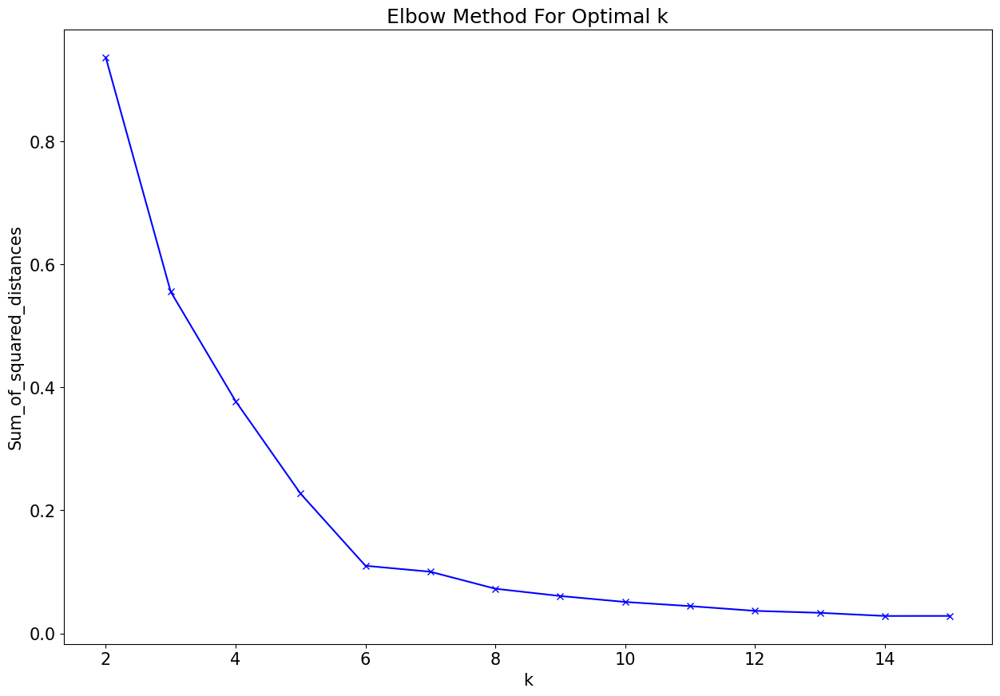

In [ ]:
recur_Sum_of_squared_distances = []
K = range(2,16)
for k in K:
  print("--------------- Calculating for K = " + str(k) + " ---------------")
  km = TimeSeriesKMeans(n_clusters=k,
                        n_init=2,
                        metric="dtw",
                        verbose=False,
                        max_iter_barycenter=10,
                        random_state=0)

  km = km.fit(recur_data_train)
  recur_Sum_of_squared_distances.append(km.inertia_)

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(15,10))
plt.plot(K, recur_Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

DBA k-means
DBA silhoutte: 0.72


<ipython-input-21-71ed33d77944>:14: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



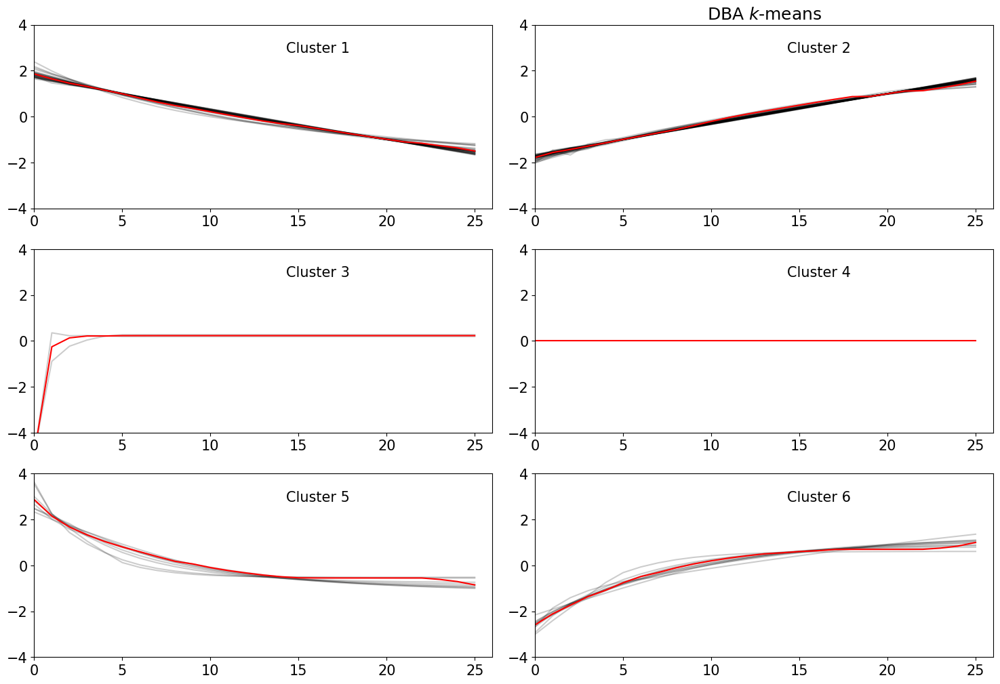

In [ ]:
n_clusters = 6
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                          n_init=2,
                          metric="dtw",
                          verbose=False,
                          max_iter_barycenter=10,
                          random_state=seed)
recur_y_pred_dba_km = dba_km.fit_predict(recur_data_train)
print("DBA silhoutte: {:.2f}".format(silhouette_score(recur_data_train, recur_y_pred_dba_km, metric="dtw")))

fig, size = plt.subplots(figsize=(15, 20))
for yi in range(n_clusters):
    plt.subplot(n_clusters, 2, yi+1)
    for xx in recur_data_train[recur_y_pred_dba_km == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")



plt.tight_layout()
plt.show()

In [ ]:
recur_cluster = []
for i in range (0,n_clusters):
  recur_clusters = []
  recur_cluster.append(recur_clusters)

for i in range(0,data.shape[1]):
  recur_cluster[recur_y_pred_dba_km[i]].append(data.iloc[:,i].name)

for i in range(0, n_clusters):
  print('Cluster ' + str(i+1) + ': ' + ', '.join(recur_cluster[i]))

Cluster 1: ASII.JK, BBNI.JK, BBRI.JK, BBTN.JK, BHIT.JK, BMRI.JK, BWPT.JK, DEWA.JK, ELSA.JK, ENRG.JK, ERAA.JK, GJTL.JK, HMSP.JK, INCO.JK, INDF.JK, ISAT.JK, JPFA.JK, JSMR.JK, KRAS.JK, MAPI.JK, MLPL.JK, MNCN.JK, SMCB.JK, SMRA.JK, SSIA.JK, TINS.JK, TOWR.JK, TPIA.JK, TRAM.JK, VIVA.JK
Cluster 2: AALI.JK, ACES.JK, ADHI.JK, ADRO.JK, AKRA.JK, ASRI.JK, BBCA.JK, BBKP.JK, BDMN.JK, BJBR.JK, BKSL.JK, BMTR.JK, BRPT.JK, BSDE.JK, BUMI.JK, CTRA.JK, DOID.JK, EXCL.JK, GGRM.JK, HRUM.JK, IMAS.JK, INDY.JK, INKP.JK, KIJA.JK, LPKR.JK, LPPF.JK, LSIP.JK, MPPA.JK, PGAS.JK, PTBA.JK, PWON.JK, SGRO.JK, SIMP.JK, TAXI.JK, TBIG.JK, TKIM.JK, TLKM.JK, UNSP.JK, UNTR.JK, UNVR.JK, WSKT.JK
Cluster 3: BNBR.JK, MIRA.JK
Cluster 4: BTEL.JK
Cluster 5: BISI.JK, BLTA.JK, HEXA.JK, ICBP.JK, INTA.JK, INTP.JK, KLBF.JK, MYRX.JK
Cluster 6: ANTM.JK, CPIN.JK, ELTY.JK, GIAA.JK, ITMG.JK, MAIN.JK, MEDC.JK, SCMA.JK, SMGR.JK, WIKA.JK


In [ ]:
for i in range(0, n_clusters):
  fig = px.line(recur_predictions, x = recur_predictions.index, y = recur_cluster[i])
  fig.update_layout(title_text =  "Cluster "+ str(i+1))
  fig.show()

Sharpe Ratio

In [ ]:
risk_free_rate = 0.06/52
recur_weekly_returns = recur_predictions.pct_change()
recur_weekly_returns.dropna(inplace = True)
recur_avg_weekly_returns = recur_weekly_returns.mean()
recur_std_weekly_returns = recur_weekly_returns.std()
recur_sharpe_ratio = (recur_avg_weekly_returns - risk_free_rate) / recur_std_weekly_returns

In [ ]:
recur_sharpe_ratio.to_frame()

,0
AALI.JK,2.577186
ACES.JK,-2.847930
ADHI.JK,1.882545
ADRO.JK,3.254798
AKRA.JK,1.637563
...,...
UNTR.JK,5.012977
UNVR.JK,7.774684
VIVA.JK,-9.050418
WIKA.JK,0.771974


In [ ]:
recur_portfolio = []
for i in range(0, n_clusters):
  recur_portfolio.append(str(recur_sharpe_ratio[recur_cluster[i]].idxmax()))
  print("Cluster "+str(i+1)+": Stock with the highest Sharpe Ratio is " + str(recur_sharpe_ratio[recur_cluster[i]].idxmax()) + " with value of " + str(max(recur_sharpe_ratio[recur_cluster[i]])))

Cluster 1: Stock with the highest Sharpe Ratio is MLPL.JK with value of 0.17243709164388432
Cluster 2: Stock with the highest Sharpe Ratio is BDMN.JK with value of 13.22953340271728
Cluster 3: Stock with the highest Sharpe Ratio is BNBR.JK with value of -0.16195926227803356
Cluster 4: Stock with the highest Sharpe Ratio is BTEL.JK with value of -inf
Cluster 5: Stock with the highest Sharpe Ratio is INTP.JK with value of -1.0209734941742588
Cluster 6: Stock with the highest Sharpe Ratio is CPIN.JK with value of 1.2662232505154023


In [ ]:
recur_portfolio = ['MLPL.JK', 'BDMN.JK', 'BNBR.JK', 'BTEL.JK', 'INTP.JK', 'CPIN.JK']

In [ ]:
print("The selected portfolio consists of "+", ".join(recur_portfolio))

The selected portfolio consists of MLPL.JK, BDMN.JK, BNBR.JK, BTEL.JK, INTP.JK, CPIN.JK


In [ ]:
from IPython.display import display
fig = px.line(data[:-26], y = recur_portfolio)
display(fig)

In [ ]:
predictions_C = recur_predictions[recur_portfolio]
predictions_C

,MLPL.JK,BDMN.JK,BNBR.JK,BTEL.JK,INTP.JK,CPIN.JK
Date,,,,,,
2023-07-03,75.566864,2819.913129,3733.728650,50.0,9719.015356,5333.260231
2023-07-10,70.273243,2850.253294,3784.983206,50.0,9621.608054,5452.845140
2023-07-17,65.299276,2881.531497,3793.488267,50.0,9564.377474,5566.659667
2023-07-24,60.491360,2914.236862,3796.982738,50.0,9529.421638,5676.058541
2023-07-31,55.692562,2947.955329,3799.130517,50.0,9502.934038,5785.812482
2023-08-07,50.857372,2980.406883,3799.956861,50.0,9480.693655,5895.078836
2023-08-14,46.296434,3012.964168,3799.989271,50.0,9465.022135,6001.911214
2023-08-21,41.899278,3045.566432,3799.996424,50.0,9453.919124,6106.646680
2023-08-28,37.649287,3078.217179,3799.999106,50.0,9445.950976,6209.375260


In [ ]:
evaluation_df_C =  recur_evaluation_df[recur_portfolio]
evaluation_df_C

,MLPL.JK,BDMN.JK,BNBR.JK,BTEL.JK,INTP.JK,CPIN.JK
MAE,59.011706,516.920184,3745.586999,2.002344e-08,654.652124,1227.209458
RMSE,62.344657,603.703364,3745.610813,2.002344e-08,878.613400,1324.084874
MAPE,0.738435,0.193426,73.646606,4.004687e-10,0.061672,0.240205


In [ ]:
predictions_C.to_csv('/content/drive/MyDrive/Portfolio Selection/predictions_C.csv')
evaluation_df_C.to_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_C.csv')

### Multioutput Predictions

In [ ]:
# multi_predictions = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/multi_predictions.csv', index_col = 0)
# multi_evaluation_df = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/multi_evaluation_df.csv', index_col = 0)

In [ ]:
seed = 0
np.random.seed(seed)
multi_data_new = multi_predictions.transpose().to_numpy()
multi_data_train = TimeSeriesScalerMeanVariance().fit_transform(multi_data_new)
sz = multi_data_train.shape[1]

Elbow Point

--------------- Calculating for K = 2 ---------------
--------------- Calculating for K = 3 ---------------
--------------- Calculating for K = 4 ---------------
--------------- Calculating for K = 5 ---------------
--------------- Calculating for K = 6 ---------------
--------------- Calculating for K = 7 ---------------
--------------- Calculating for K = 8 ---------------
--------------- Calculating for K = 9 ---------------
--------------- Calculating for K = 10 ---------------
--------------- Calculating for K = 11 ---------------
--------------- Calculating for K = 12 ---------------
--------------- Calculating for K = 13 ---------------
--------------- Calculating for K = 14 ---------------
--------------- Calculating for K = 15 ---------------


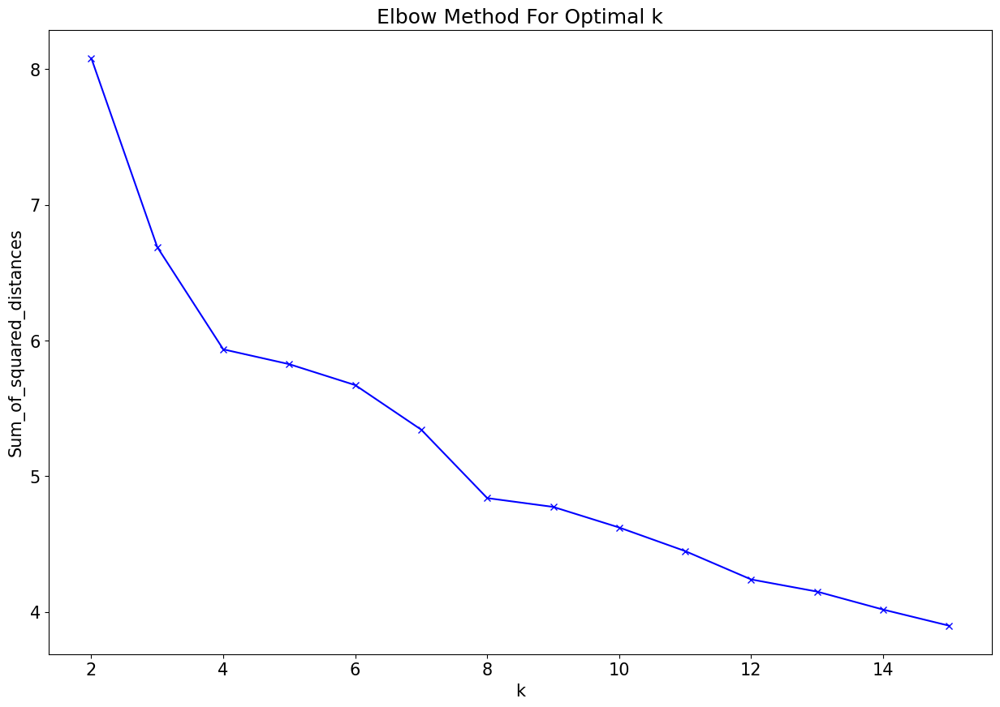

In [ ]:
multi_Sum_of_squared_distances = []
K = range(2,16)
for k in K:
  print("--------------- Calculating for K = " + str(k) + " ---------------")
  km = TimeSeriesKMeans(n_clusters=k,
                        n_init=2,
                        metric="dtw",
                        verbose=False,
                        max_iter_barycenter=10,
                        random_state=0)

  km = km.fit(multi_data_train)
  multi_Sum_of_squared_distances.append(km.inertia_)

plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(15,10))
plt.plot(K, multi_Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

Silhouette Score

For n_clusters = 2 The average silhouette_score is : 0.46
For n_clusters = 3 The average silhouette_score is : 0.38
For n_clusters = 4 The average silhouette_score is : 0.32
For n_clusters = 5 The average silhouette_score is : 0.26
For n_clusters = 6 The average silhouette_score is : 0.25
For n_clusters = 7 The average silhouette_score is : 0.23
For n_clusters = 8 The average silhouette_score is : 0.24
For n_clusters = 9 The average silhouette_score is : 0.15
For n_clusters = 10 The average silhouette_score is : 0.15
For n_clusters = 11 The average silhouette_score is : 0.15
For n_clusters = 12 The average silhouette_score is : 0.12
For n_clusters = 13 The average silhouette_score is : 0.19
For n_clusters = 14 The average silhouette_score is : 0.17
For n_clusters = 15 The average silhouette_score is : 0.10
For n_clusters = 16 The average silhouette_score is : 0.19
For n_clusters = 17 The average silhouette_score is : 0.10
For n_clusters = 18 The average silhouette_score is : 0.01
For n

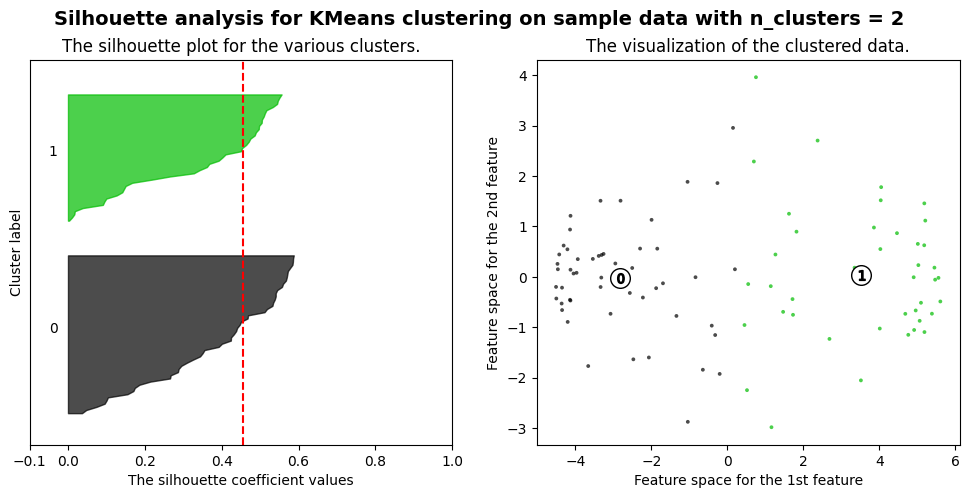

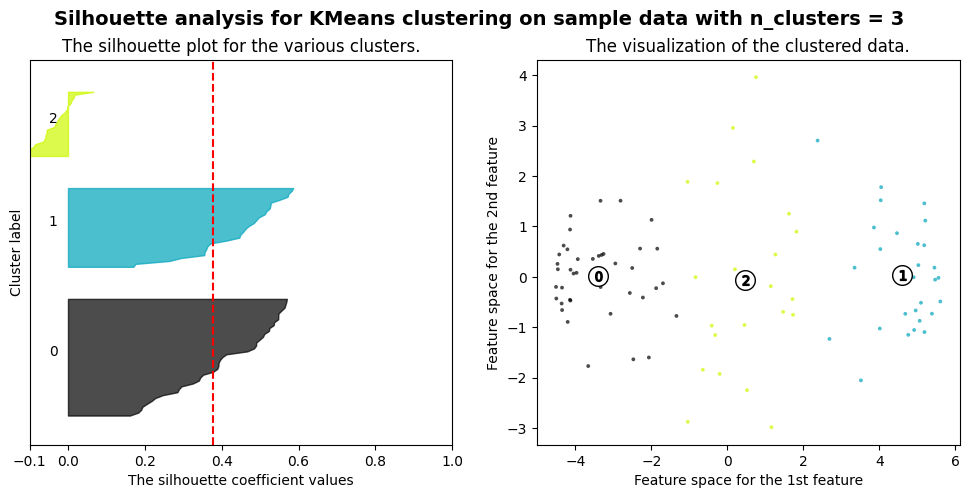

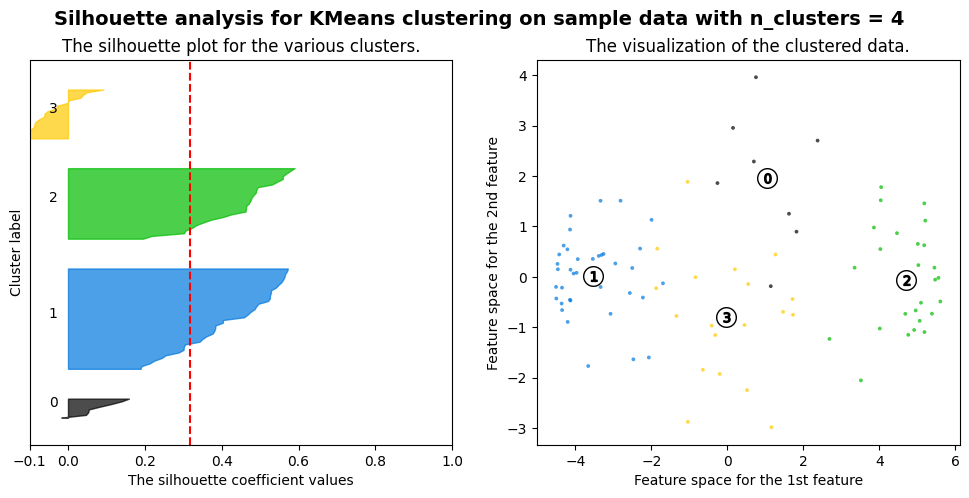

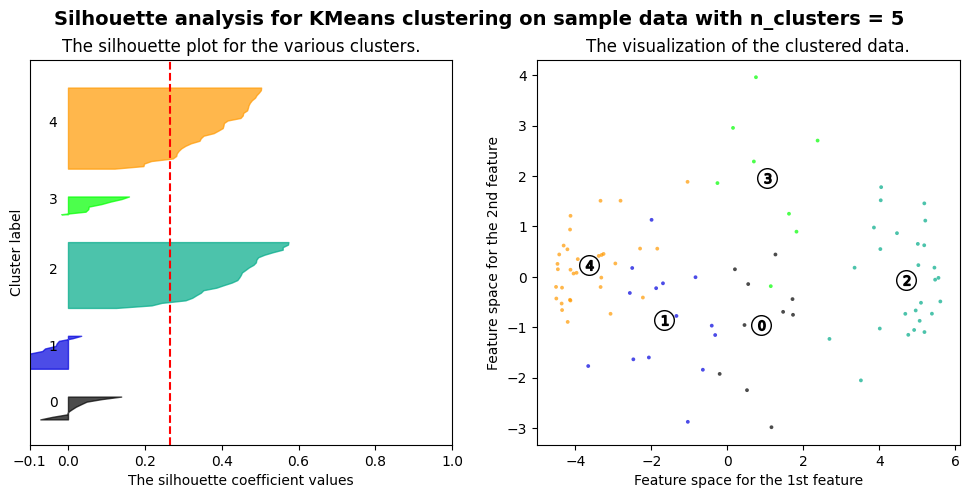

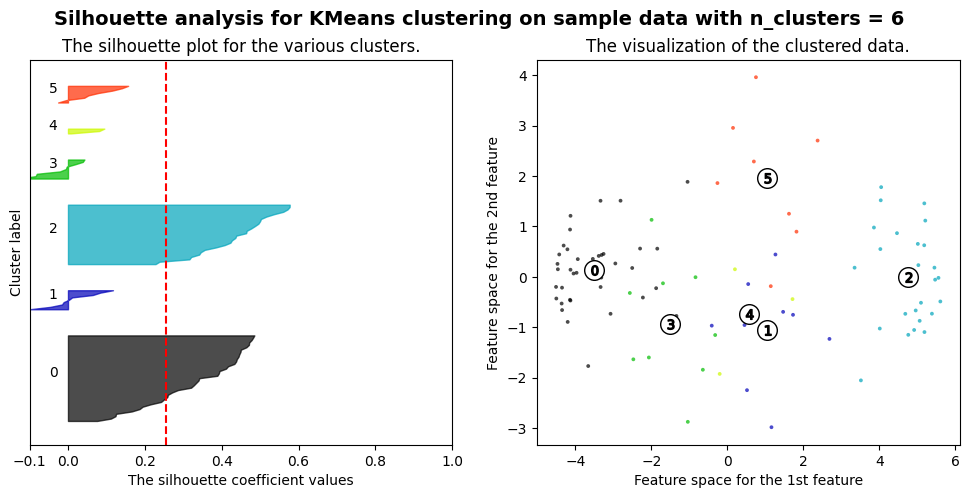

...

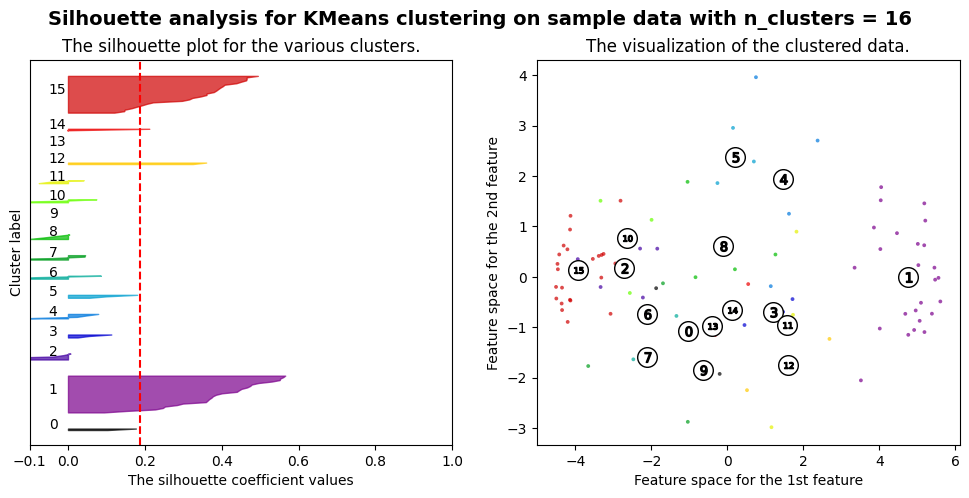

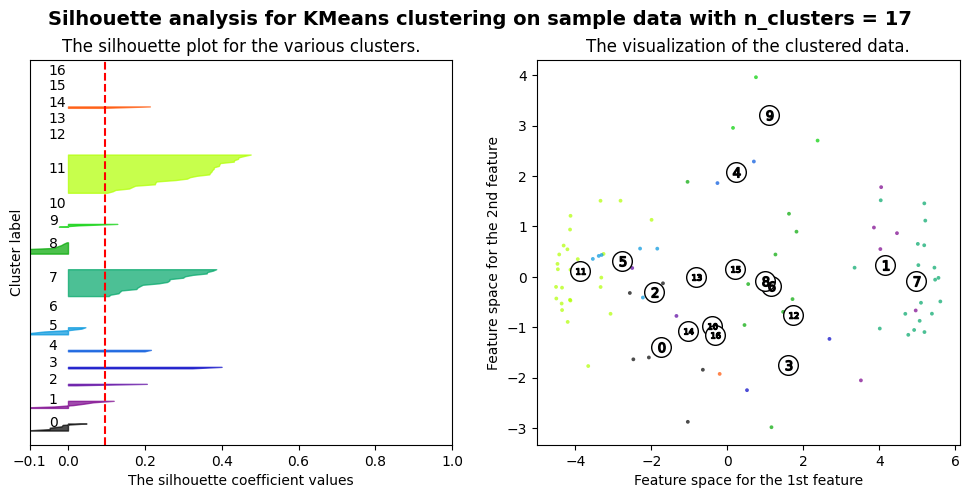

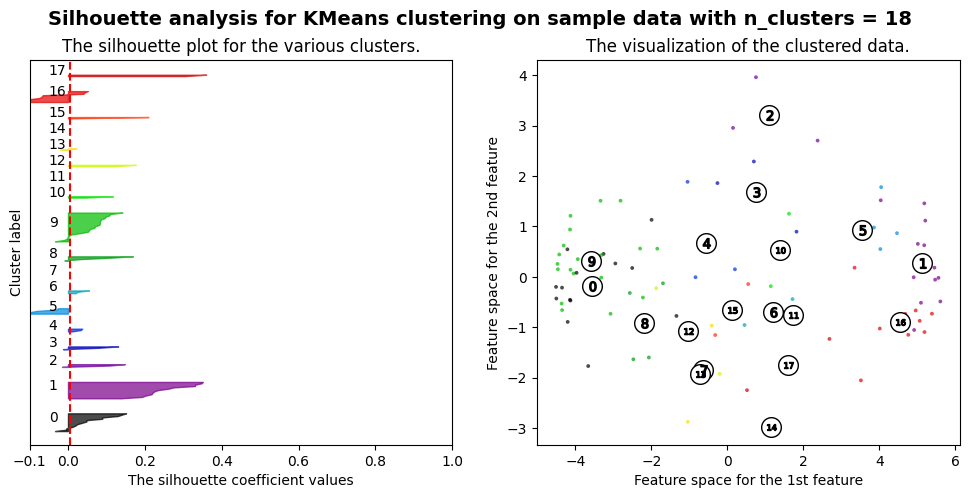

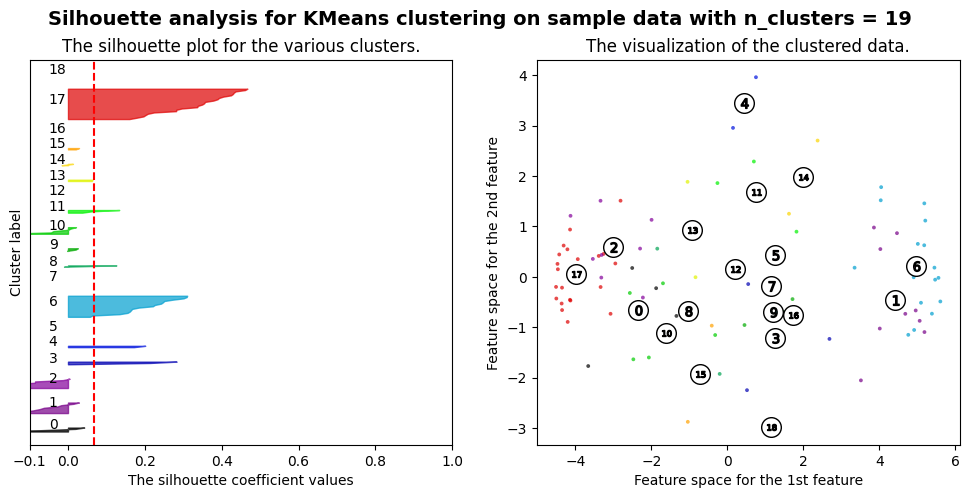

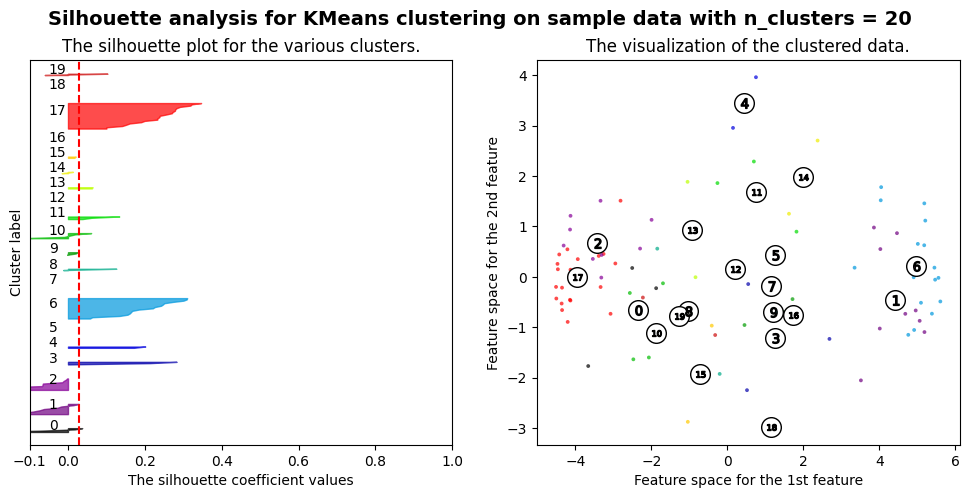

In [ ]:
train_pca = list(multi_data_train.reshape(multi_data_train.shape[0], multi_data_train.shape[1]))
pca = PCA(n_components=0.95)
train_pca = pca.fit_transform(train_pca)

X = train_pca

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(12, 5)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0, n_init = 10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is : {:.2f}"
        .format(silhouette_avg),
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()


        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        X[:, 0], X[:, 1], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Clustering Result

DBA k-means
DBA silhoutte: 0.20


<ipython-input-12-514a4fe164ea>:14: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(n_clusters, 2, yi+1)


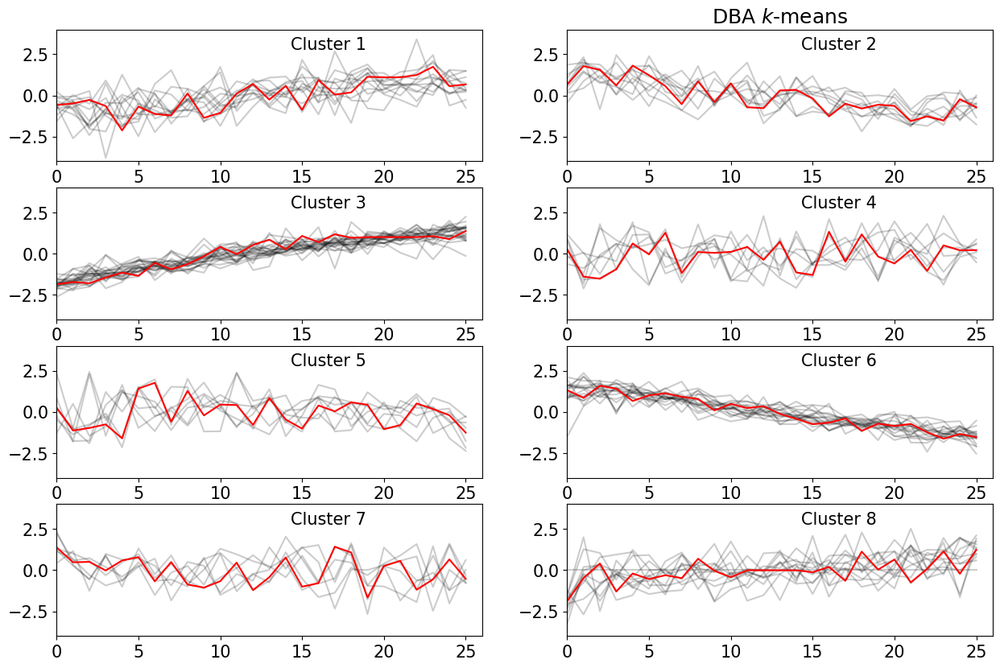

In [ ]:
n_clusters = 8
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=n_clusters,
                          n_init=2,
                          metric="dtw",
                          verbose=False,
                          max_iter_barycenter=10,
                          random_state=seed)
multi_y_pred_dba_km = dba_km.fit_predict(multi_data_train)
print("DBA silhoutte: {:.2f}".format(silhouette_score(multi_data_train, multi_y_pred_dba_km, metric="dtw")))

fig, size = plt.subplots(figsize=(15, 20))
for yi in range(n_clusters):
    plt.subplot(n_clusters, 2, yi+1)
    for xx in multi_data_train[multi_y_pred_dba_km == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85,'Cluster %d' % (yi + 1),
             transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")



# plt.tight_layout()
plt.show()

In [ ]:
multi_cluster = []
for i in range (0,n_clusters):
  multi_clusters = []
  multi_cluster.append(multi_clusters)

for i in range(0,multi_predictions.shape[1]):
  multi_cluster[multi_y_pred_dba_km[i]].append(multi_predictions.iloc[:,i].name)

for i in range(0, n_clusters):
  print('Cluster ' + str(i+1) + ': ' + ', '.join(multi_cluster[i]))

Cluster 1: ACES.JK, BBKP.JK, BLTA.JK, BMRI.JK, CPIN.JK, DEWA.JK, EXCL.JK, GIAA.JK, INCO.JK, KIJA.JK, MNCN.JK, WSKT.JK
Cluster 2: AKRA.JK, BHIT.JK, BKSL.JK, GGRM.JK, HMSP.JK, ICBP.JK, INDF.JK, SIMP.JK, SSIA.JK
Cluster 3: AALI.JK, ADRO.JK, BBCA.JK, BBTN.JK, BJBR.JK, BUMI.JK, DOID.JK, HEXA.JK, HRUM.JK, INTP.JK, ITMG.JK, JPFA.JK, JSMR.JK, KRAS.JK, MLPL.JK, PWON.JK, SMCB.JK, SMGR.JK, SMRA.JK, TINS.JK, TRAM.JK, WIKA.JK
Cluster 4: BBRI.JK, BMTR.JK, ELTY.JK, INKP.JK, MAIN.JK, TAXI.JK, TPIA.JK
Cluster 5: ASRI.JK, BSDE.JK, BWPT.JK, MIRA.JK, SGRO.JK, TBIG.JK, UNVR.JK
Cluster 6: ANTM.JK, ASII.JK, BBNI.JK, BISI.JK, CTRA.JK, ELSA.JK, ENRG.JK, ERAA.JK, GJTL.JK, IMAS.JK, INDY.JK, ISAT.JK, LPPF.JK, MEDC.JK, PTBA.JK, TLKM.JK, UNTR.JK
Cluster 7: BNBR.JK, INTA.JK, LPKR.JK, MYRX.JK, TOWR.JK, VIVA.JK
Cluster 8: ADHI.JK, BDMN.JK, BRPT.JK, BTEL.JK, KLBF.JK, LSIP.JK, MAPI.JK, MPPA.JK, PGAS.JK, SCMA.JK, TKIM.JK, UNSP.JK


In [ ]:
for i in range(0, n_clusters):
  fig = px.line(multi_predictions, x = multi_predictions.index, y = multi_cluster[i])
  fig.update_layout(title_text =  "Cluster "+ str(i+1))
  fig.show()

Sharpe Ratio

In [ ]:
risk_free_rate = 0.06/52
multi_weekly_returns = multi_predictions.pct_change()
multi_weekly_returns.dropna(inplace = True)
multi_avg_weekly_returns = multi_weekly_returns.mean()
multi_std_weekly_returns = multi_weekly_returns.std()
multi_sharpe_ratio = (multi_avg_weekly_returns - risk_free_rate) / multi_std_weekly_returns

In [ ]:
multi_sharpe_ratio.to_frame()

,0
AALI.JK,0.124391
ACES.JK,0.047844
ADHI.JK,0.133870
ADRO.JK,0.292797
AKRA.JK,-0.167923
...,...
UNTR.JK,-0.281195
UNVR.JK,0.008053
VIVA.JK,0.015475
WIKA.JK,0.130498


In [ ]:
multi_portfolio = []
for i in range(0, n_clusters):
  multi_portfolio.append(str(multi_sharpe_ratio[multi_cluster[i]].idxmax()))
  print("Cluster "+str(i+1)+": Stock with the highest Sharpe Ratio is " + str(multi_sharpe_ratio[multi_cluster[i]].idxmax()) + " with value of " + str(max(multi_sharpe_ratio[multi_cluster[i]])))

Cluster 1: Stock with the highest Sharpe Ratio is WSKT.JK with value of 0.11175498880819755
Cluster 2: Stock with the highest Sharpe Ratio is HMSP.JK with value of -0.017690600316461077
Cluster 3: Stock with the highest Sharpe Ratio is INTP.JK with value of 0.5934643048864392
Cluster 4: Stock with the highest Sharpe Ratio is ELTY.JK with value of 0.1757358901968163
Cluster 5: Stock with the highest Sharpe Ratio is BWPT.JK with value of 0.02394910021875724
Cluster 6: Stock with the highest Sharpe Ratio is PTBA.JK with value of -0.13293880227442284
Cluster 7: Stock with the highest Sharpe Ratio is VIVA.JK with value of 0.015474787222070581
Cluster 8: Stock with the highest Sharpe Ratio is MPPA.JK with value of 0.15106975304639664


In [ ]:
# multi_portfolio = ['WSKT.JK','HMSP.JK','INTP.JK','ELTY.JK','BWPT.JK','PTBA.JK','VIVA.JK','MPPA.JK']

In [ ]:
print("The selected portfolio consists of "+", ".join(multi_portfolio))

The selected portfolio consists of WSKT.JK, HMSP.JK, INTP.JK, ELTY.JK, BWPT.JK, PTBA.JK, VIVA.JK, MPPA.JK


In [ ]:
from IPython.display import display
fig = px.line(multi_predictions, y = multi_portfolio)
display(fig)

In [ ]:
predictions_D = multi_predictions[multi_portfolio]
predictions_D

,WSKT.JK,HMSP.JK,INTP.JK,ELTY.JK,BWPT.JK,PTBA.JK,VIVA.JK,MPPA.JK
Date,,,,,,,,
2023-07-03,449.45248,878.90533,10137.5130,55.827580,73.544390,2206.9780,51.959137,184.06998
2023-07-10,393.63864,916.52716,10155.6160,60.447483,66.445560,2264.3610,48.644276,222.36170
2023-07-17,297.65485,937.08093,10227.8730,41.813164,68.057960,2286.1687,45.848780,224.09192
2023-07-24,378.58423,892.35474,10266.4420,65.300850,70.722350,2286.8680,50.853325,199.68784
2023-07-31,436.44700,921.68677,10301.4910,83.921550,60.283980,2296.1833,44.272000,208.26420
2023-08-07,411.39070,899.24255,10329.0400,78.161430,80.354390,2294.3080,52.249958,208.78255
2023-08-14,278.85834,922.84000,10411.2810,47.551273,83.220980,2278.1519,46.856280,218.73573
2023-08-21,357.73294,890.85754,10415.2960,54.092007,67.886010,2279.0781,50.783330,210.60880
2023-08-28,459.93713,942.86163,10474.1060,61.502740,83.435000,2287.6335,44.735970,227.08986


In [ ]:
evaluation_df_D = multi_evaluation_df[multi_portfolio]
evaluation_df_D

,WSKT.JK,HMSP.JK,INTP.JK,ELTY.JK,BWPT.JK,PTBA.JK,VIVA.JK,MPPA.JK
MAE,231.175690,46.628323,934.920170,12.980097,15.441936,400.445920,3.228536,143.682770
RMSE,241.333420,57.253820,1124.689200,17.253511,16.353964,437.161200,4.107864,145.697880
MAPE,1.144434,0.050581,0.096386,0.259602,0.272522,0.146642,0.064571,1.990139


In [ ]:
predictions_D.to_csv('/content/drive/MyDrive/Portfolio Selection/predictions_D.csv')
evaluation_df_D.to_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_D.csv')

# **IV. Evaluation**

---



---



## **Portfolio Returns**

---



In [ ]:
predictions_A = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/predictions_A.csv', index_col = 0)
predictions_B = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/predictions_B.csv', index_col = 0)
predictions_C = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/predictions_C.csv', index_col = 0)
predictions_D = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/predictions_D.csv', index_col = 0)

In [ ]:
predictions_A

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
Date,,,,,,,
2023-07-03,5108.931329,114.753196,1079.182893,632.923362,365.799016,2095.111532,331.031385
2023-07-10,5128.667503,152.129786,1093.742749,729.741807,378.098167,2094.700372,332.222150
2023-07-17,5151.980007,183.743716,1103.263375,807.068497,389.576870,2097.074973,333.988666
2023-07-24,5171.127767,213.518432,1111.883305,875.443247,400.890913,2099.685598,336.360357
2023-07-31,5188.262785,242.786586,1120.772656,938.914009,412.562910,2102.185736,338.329797
2023-08-07,5202.449872,271.851972,1130.356025,998.510665,424.259023,2104.185778,340.068874
2023-08-14,5215.925486,299.137087,1139.541265,1050.247706,435.967116,2106.264837,341.810642
2023-08-21,5228.313205,324.977616,1148.413541,1096.156625,447.683088,2108.419833,343.532206
2023-08-28,5239.535472,349.583298,1157.056306,1137.201087,459.421544,2110.586973,345.220089


In [ ]:
predictions_B

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
Date,,,,,,,
2023-07-03,5000.8423,74.385410,1057.40810,863.98980,305.40375,2184.8140,305.48290
2023-07-10,5053.0273,55.706486,1052.61230,827.52080,308.85170,2202.4470,301.56192
2023-07-17,5059.8330,104.101890,1052.47000,753.49100,323.95258,2219.1995,296.96295
2023-07-24,5058.0884,44.520294,1048.36440,847.10350,329.47253,2159.1430,299.72122
2023-07-31,5064.5396,75.799070,1044.12960,777.01953,331.68198,2209.5913,301.89417
2023-08-07,5206.5723,58.726227,1045.21640,940.87300,323.53247,2206.7960,298.35242
2023-08-14,5122.1104,90.907510,1041.84780,741.21234,317.80072,2225.0576,299.93915
2023-08-21,5104.5730,98.961460,1041.63770,877.14550,340.62506,2209.3210,304.22880
2023-08-28,5081.6150,100.848114,1039.71220,687.50520,331.92822,2212.8137,295.83112


In [ ]:
predictions_C

,BDMN.JK,INTP.JK,BNBR.JK,MLPL.JK,BTEL.JK
Date,,,,,
2023-07-03,2819.913129,9719.015356,3733.728650,75.566864,50.0
2023-07-10,2850.253294,9621.608054,3784.983206,70.273243,50.0
2023-07-17,2881.531497,9564.377474,3793.488267,65.299276,50.0
2023-07-24,2914.236862,9529.421638,3796.982738,60.491360,50.0
2023-07-31,2947.955329,9502.934038,3799.130517,55.692562,50.0
2023-08-07,2980.406883,9480.693655,3799.956861,50.857372,50.0
2023-08-14,3012.964168,9465.022135,3799.989271,46.296434,50.0
2023-08-21,3045.566432,9453.919124,3799.996424,41.899278,50.0
2023-08-28,3078.217179,9445.950976,3799.999106,37.649287,50.0


In [ ]:
predictions_D

,ELTY.JK,VIVA.JK,HEXA.JK,WSKT.JK,INDF.JK,INTP.JK,MAIN.JK
Date,,,,,,,
2023-07-03,55.827580,51.959137,4846.4870,449.45248,6425.0103,10137.5130,719.32220
2023-07-10,60.447483,48.644276,4818.9970,393.63864,6696.0250,10155.6160,681.91675
2023-07-17,41.813164,45.848780,5062.0083,297.65485,6479.0967,10227.8730,794.04150
2023-07-24,65.300850,50.853325,5012.2390,378.58423,6663.3047,10266.4420,744.96844
2023-07-31,83.921550,44.272000,5028.1685,436.44700,6424.6436,10301.4910,1101.73560
2023-08-07,78.161430,52.249958,5023.9090,411.39070,6172.9340,10329.0400,540.26324
2023-08-14,47.551273,46.856280,5069.5690,278.85834,6480.9670,10411.2810,830.43750
2023-08-21,54.092007,50.783330,5257.4385,357.73294,6573.0327,10415.2960,663.51550
2023-08-28,61.502740,44.735970,5122.9330,459.93713,6358.3420,10474.1060,1081.65380


In [ ]:
returns_A = predictions_A.pct_change()
returns_A.dropna(inplace = True)
predictions_A_returns = returns_A.mean().mean()

returns_B = predictions_B.pct_change()
returns_B.dropna(inplace = True)
predictions_B_returns = returns_B.mean().mean()

returns_C = predictions_C.pct_change()
returns_C.dropna(inplace = True)
predictions_C_returns = returns_C.mean().mean()

returns_D = predictions_D.pct_change()
returns_D.dropna(inplace = True)
predictions_D_returns = returns_D.mean().mean()

portfolio_returns = {'Portfolio A': [predictions_A_returns],
                     'Portfolio B': [predictions_B_returns],
                     'Portfolio C': [predictions_C_returns],
                     'Portfolio D': [predictions_D_returns]
                    }

portfolio_returns_df = pd.DataFrame(portfolio_returns, index =['Returns']).transpose()
portfolio_returns_df

,Returns
Portfolio A,0.020549
Portfolio B,0.020386
Portfolio C,0.091276
Portfolio D,0.015359


<Axes: >

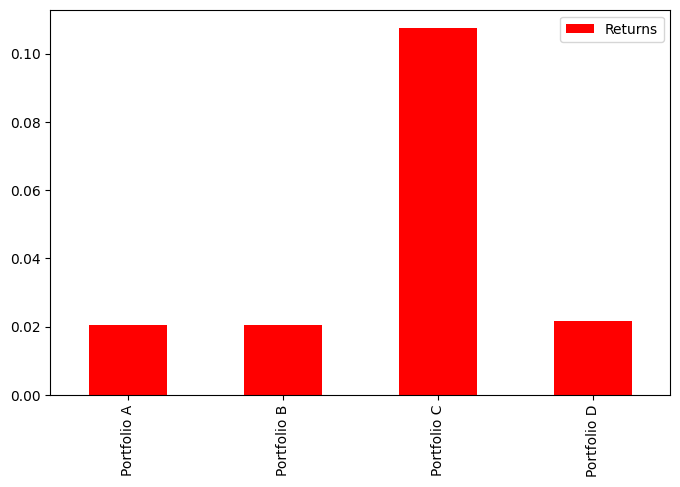

In [ ]:
portfolio_returns_df.plot(kind = 'bar', figsize = (8,5), color = 'r')

In [ ]:
true_returns_A = data[portfolio][-26:].pct_change()
true_returns_A.dropna(inplace = True)
true_A_returns = true_returns_A.mean().mean()

true_returns_B = data[portfolio][-26:].pct_change()
true_returns_B.dropna(inplace = True)
true_B_returns = true_returns_B.mean().mean()

true_returns_C = data[recur_portfolio][-26:].pct_change()
true_returns_C.dropna(inplace = True)
true_C_returns = true_returns_C.mean().mean()

true_returns_D = data[multi_portfolio][-26:].pct_change()
true_returns_D.dropna(inplace = True)
true_D_returns = true_returns_D.mean().mean()

true_portfolio_returns = {'Portfolio A': [true_A_returns],
                     'Portfolio B': [true_B_returns],
                     'Portfolio C': [true_C_returns],
                     'Portfolio D': [true_D_returns]
                    }

true_portfolio_returns_df = pd.DataFrame(true_portfolio_returns, index =['Returns']).transpose()
true_portfolio_returns_df

,Returns
Portfolio A,0.008445
Portfolio B,0.008445
Portfolio C,-0.002560
Portfolio D,-0.001401


<Axes: >

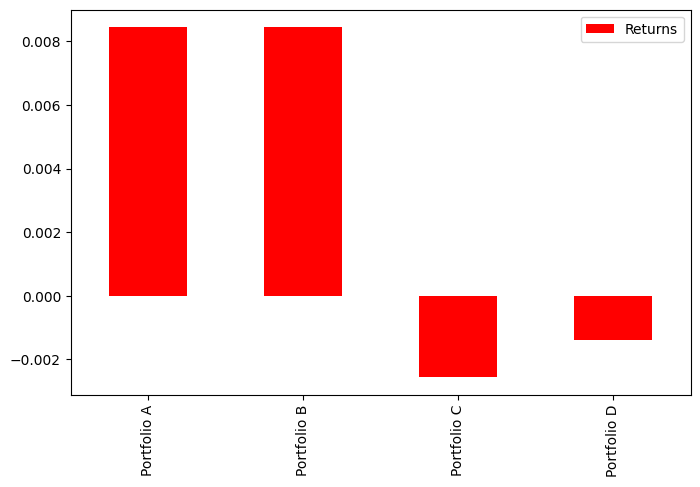

In [ ]:
true_portfolio_returns_df.plot(kind = 'bar', figsize = (8,5), color = 'r')

## **Model Evaluation**

---



In [ ]:
evaluation_df_A = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_A.csv', index_col = 0)
evaluation_df_B = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_B.csv', index_col = 0)
evaluation_df_C = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_C.csv', index_col = 0)
evaluation_df_D = pd.read_csv('/content/drive/MyDrive/Portfolio Selection/evaluation_df_D.csv', index_col = 0)

In [ ]:
data[portfolio].mean()

Ticker
HEXA.JK    2119.676171
ELTY.JK     232.617021
CTRA.JK    1027.263578
MAIN.JK    1326.963328
DOID.JK     399.142066
TPIA.JK    1543.625847
ELSA.JK     295.681701
dtype: float64

In [ ]:
evaluation_df_A

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
MAE,347.773339,369.766856,99.059850,704.891803,123.826725,785.022590,50.604379
RMSE,429.619162,399.835905,116.783181,737.146685,164.814935,1289.653669,53.749698
MAPE,0.060689,7.395337,0.092285,1.436959,0.340565,0.204759,0.124567


In [ ]:
evaluation_df_B

,HEXA.JK,ELTY.JK,CTRA.JK,MAIN.JK,DOID.JK,TPIA.JK,ELSA.JK
MAE,565.579400,27.134352,65.026060,322.307250,54.992867,771.414730,104.568085
RMSE,593.732300,33.754578,82.059680,332.785830,70.068000,1259.549700,106.375510
MAPE,0.100179,0.542687,0.057818,0.664861,0.132142,0.204053,0.258649


In [ ]:
data[recur_portfolio].mean()

Ticker
MLPL.JK      231.040890
BDMN.JK     3270.163692
BNBR.JK     3433.406383
BTEL.JK       50.000000
INTP.JK    12805.358658
CPIN.JK     4474.618942
dtype: float64

In [ ]:
evaluation_df_C

,MLPL.JK,BDMN.JK,BNBR.JK,BTEL.JK,INTP.JK,CPIN.JK
MAE,59.011706,516.920184,3745.586999,2.002344e-08,654.652124,1227.209458
RMSE,62.344657,603.703364,3745.610813,2.002344e-08,878.613400,1324.084874
MAPE,0.738435,0.193426,73.646606,4.004687e-10,0.061672,0.240205


In [ ]:
data[multi_portfolio].mean()

Ticker
WSKT.JK     1352.608915
HMSP.JK     1759.524495
INTP.JK    12805.358658
ELTY.JK      232.617021
BWPT.JK      164.780851
PTBA.JK     1470.496531
VIVA.JK      173.719149
MPPA.JK      779.685165
dtype: float64

In [ ]:
evaluation_df_D

,WSKT.JK,HMSP.JK,INTP.JK,ELTY.JK,BWPT.JK,PTBA.JK,VIVA.JK,MPPA.JK
MAE,231.175690,46.628323,934.920170,12.980097,15.441936,400.445920,3.228536,143.682770
RMSE,241.333420,57.253820,1124.689200,17.253511,16.353964,437.161200,4.107864,145.697880
MAPE,1.144434,0.050581,0.096386,0.259602,0.272522,0.146642,0.064571,1.990139


# **Melihat Konsistensi dari LSTM**

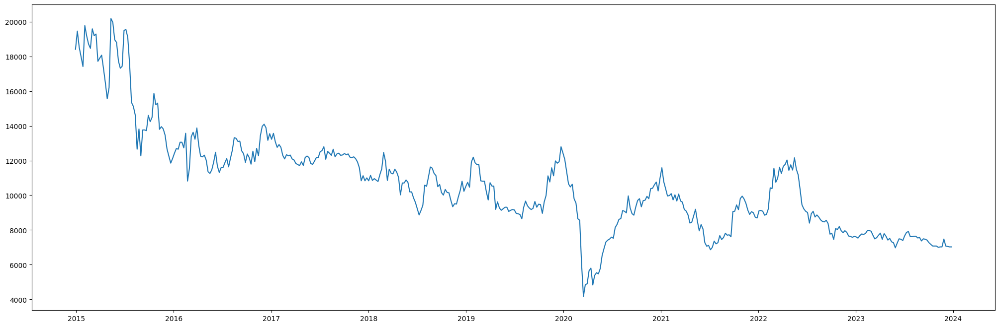

In [ ]:
plt.plot(data['AALI.JK'])

In [ ]:
data['AALI.JK'].mean()

10674.815869140624

## Recursive Strategy

In [ ]:
data_copy = data.copy()
recur_consistency_predictions = pd.DataFrame()
recur_consistency_predictions.index = data_copy.iloc[-26:].index
column_names = []
for i in range(0,50):
  column_names.append("Prediction " + str(i+1))
recur_consistency_evaluation_df = pd.DataFrame(columns = column_names, index = ['MAE','RMSE','MAPE'])
for i in range(0, 50):
  print("--------------- Calculating for iteration " + str(i+1) + " ---------------")
  data_copy = data.copy()
  scaler = MinMaxScaler()
  data_copy[data_copy.columns[0]] = scaler.fit_transform(data_copy[data_copy.columns[0]].values.reshape(-1,1))

  data_windowed = windowed_df(data_copy.iloc[:,0], 5,1)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 1)

  Uq_90 = int((X.shape[0] - X[-26:].shape[0])*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-26], X[Uq_90:-26], y[Uq_90:-26]
  dates_test, X_test, y_test = dates[-26:], X[-26:], y[-26:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'tanh', input_shape = (5,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(1, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

  arr = X_test[0]
  test_predictions = np.zeros(shape = (26,1))
  for j in range(0,26):
    arr = arr.reshape(1, arr.shape[0], arr.shape[1])
    prediction = Univariate12.predict(arr)
    test_predictions[j] = prediction
    arr = arr[0,1:5]
    arr = np.append(arr, prediction, axis = 0)
  test_predictions = scaler.inverse_transform(test_predictions)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  recur_consistency_evaluation_df.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  recur_consistency_evaluation_df.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  recur_consistency_evaluation_df.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = ["Prediction "+str(i+1)], index = dates_test)
  recur_consistency_predictions = recur_consistency_predictions.join(test_predictions_df)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 30ms/step
--------------- Calculating for iteration 29 ---------------
Epoch 1/100
13/13 [==============================] - 4s 84ms/step - loss: 0.2077 - mean_absolute_error: 0.4187 - val_loss: 0.0260 - val_mean_absolute_error: 0.1601
Epoch 2/100
13/13 [==============================] - 0s 15ms/step - loss: 0.1055 - mean_absolute_error: 0.2905 - val_loss: 0.0013 - val_mean_absolute_error: 0.0328
Epoch 3/100
13/13 [==============================] - 0s 14ms/step - loss: 0.0195 - mean_absolute_error: 0.1050 - val_loss: 0.0277 - val_mean_absolute_error: 0.1658
Epoch 4/100
13/13 [==============================] - 0s 12ms/step - loss: 0.0112 - mean_absolute_error: 0.0865 - val_loss: 0.0078 - val_mean_absolute_error: 0.0870
Epoch 5/100
13/13 [==============================] - 0s 15ms/step - loss: 0.0070 - mean_absolute_error: 0.0610 - val_loss: 0.0089 - val_mean_absolute_error: 0.0936
Epoch 6/100
13/1

In [ ]:
recur_consistency_predictions

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 41,Prediction 42,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,7366.447091,7723.638921,7581.797467,7473.072234,7494.910512,7444.416472,7692.151149,7617.720170,7448.941580,7540.057108,...,7458.568411,7581.619975,7606.916497,7506.944706,7560.103998,7518.449284,7405.324427,7673.111004,7830.198219,7381.060177
2023-07-10,7325.941785,7902.794868,7667.647856,7497.127739,7535.489535,7447.400925,7851.562229,7750.830129,7460.068987,7607.976205,...,7467.490519,7671.495678,7691.449766,7555.554795,7623.452659,7570.249470,7387.349716,7818.852048,8112.403213,7346.835583
2023-07-17,7283.158179,8093.514557,7756.137971,7520.757882,7575.356201,7448.271450,8016.513037,7884.423661,7468.779249,7677.796668,...,7474.319215,7763.756081,7779.764059,7604.034865,7688.985624,7622.111683,7367.144657,7971.792280,8403.688722,7308.260509
2023-07-24,7244.586207,8296.295637,7851.713479,7549.010468,7619.310209,7454.902614,8187.997913,8018.709986,7481.594744,7753.371805,...,7487.980902,7861.893781,7877.995277,7656.391386,7761.318897,7679.157445,7351.696830,8132.834671,8704.835571,7275.717324
2023-07-31,7208.234802,8499.841558,7947.700751,7577.324843,7663.102469,7462.249236,8357.320193,8150.324378,7495.053174,7828.635377,...,7502.163855,7959.139724,7975.321617,7708.578047,7832.956035,7735.661186,7337.615029,8292.906577,9009.224524,7245.408781
2023-08-07,7173.004893,8695.260510,8038.611351,7602.736592,7703.538830,7466.920109,8517.780246,8277.049134,7506.405071,7899.240243,...,7512.649282,8050.299387,8063.118938,7757.498271,7898.477311,7787.375727,7322.936338,8445.089364,9310.331294,7215.190177
2023-08-14,7139.664660,8891.713881,8129.674156,7628.127587,7743.447007,7472.297612,8676.031183,8400.768681,7517.895335,7969.358435,...,7523.905275,8140.438943,8151.061068,7805.845938,7963.641215,7838.399859,7309.455961,8596.482976,9613.504995,7186.979101
2023-08-21,7108.024207,9086.496339,8219.641230,7652.794296,7782.218181,7477.559649,8830.369647,8521.221791,7529.111727,8037.902573,...,7534.787437,8228.276820,8236.398064,7853.043482,8026.975323,7887.747831,7296.751159,8745.114001,9918.043768,7160.388600
2023-08-28,7077.919637,9279.486695,8308.367525,7676.637478,7819.768855,7482.507257,8980.753650,8638.489098,7539.924704,8104.771505,...,7545.032867,8313.717593,8318.837683,7899.021956,8088.324805,7935.316344,7284.657324,8890.920412,10224.195719,7135.109731


In [ ]:
recur_consistency_predictions['mean'] = recur_consistency_predictions.iloc[:,0:50].mean(axis = 1)
recur_consistency_predictions['std'] = recur_consistency_predictions.iloc[:,0:50].std(axis = 1)
recur_consistency_predictions

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50,mean,std
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,7366.447091,7723.638921,7581.797467,7473.072234,7494.910512,7444.416472,7692.151149,7617.720170,7448.941580,7540.057108,...,7606.916497,7506.944706,7560.103998,7518.449284,7405.324427,7673.111004,7830.198219,7381.060177,7548.985419,117.077509
2023-07-10,7325.941785,7902.794868,7667.647856,7497.127739,7535.489535,7447.400925,7851.562229,7750.830129,7460.068987,7607.976205,...,7691.449766,7555.554795,7623.452659,7570.249470,7387.349716,7818.852048,8112.403213,7346.835583,7619.399504,190.373619
2023-07-17,7283.158179,8093.514557,7756.137971,7520.757882,7575.356201,7448.271450,8016.513037,7884.423661,7468.779249,7677.796668,...,7779.764059,7604.034865,7688.985624,7622.111683,7367.144657,7971.792280,8403.688722,7308.260509,7691.365786,267.757928
2023-07-24,7244.586207,8296.295637,7851.713479,7549.010468,7619.310209,7454.902614,8187.997913,8018.709986,7481.594744,7753.371805,...,7877.995277,7656.391386,7761.318897,7679.157445,7351.696830,8132.834671,8704.835571,7275.717324,7769.289887,346.672896
2023-07-31,7208.234802,8499.841558,7947.700751,7577.324843,7663.102469,7462.249236,8357.320193,8150.324378,7495.053174,7828.635377,...,7975.321617,7708.578047,7832.956035,7735.661186,7337.615029,8292.906577,9009.224524,7245.408781,7847.428005,425.259016
2023-08-07,7173.004893,8695.260510,8038.611351,7602.736592,7703.538830,7466.920109,8517.780246,8277.049134,7506.405071,7899.240243,...,8063.118938,7757.498271,7898.477311,7787.375727,7322.936338,8445.089364,9310.331294,7215.190177,7921.343787,501.789405
2023-08-14,7139.664660,8891.713881,8129.674156,7628.127587,7743.447007,7472.297612,8676.031183,8400.768681,7517.895335,7969.358435,...,8151.061068,7805.845938,7963.641215,7838.399859,7309.455961,8596.482976,9613.504995,7186.979101,7995.236652,578.035749
2023-08-21,7108.024207,9086.496339,8219.641230,7652.794296,7782.218181,7477.559649,8830.369647,8521.221791,7529.111727,8037.902573,...,8236.398064,7853.043482,8026.975323,7887.747831,7296.751159,8745.114001,9918.043768,7160.388600,8068.111907,653.598174
2023-08-28,7077.919637,9279.486695,8308.367525,7676.637478,7819.768855,7482.507257,8980.753650,8638.489098,7539.924704,8104.771505,...,8318.837683,7899.021956,8088.324805,7935.316344,7284.657324,8890.920412,10224.195719,7135.109731,8139.854687,728.565673


In [ ]:
recur_consistency_predictions['std'].mean()

1057.4883045677886

In [ ]:
recur_consistency_predictions.to_csv('/content/drive/MyDrive/Portfolio Selection/recur_consistency_predictions.csv')

In [ ]:
recur_consistency_evaluation_df

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 41,Prediction 42,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50
MAE,358.062001,2727.988875,1353.805991,490.416393,660.570533,292.211633,2172.837663,1717.794017,347.909244,1045.331046,...,343.073945,1298.735863,1279.285432,772.041563,994.38965,796.480708,210.31011,2107.580287,4355.060069,284.552198
RMSE,384.68368,3180.80022,1596.9748,591.527581,789.801557,345.15394,2517.693739,2000.262983,414.952666,1229.988946,...,409.860661,1517.447792,1490.816834,917.400591,1165.878863,939.213863,240.796449,2460.101103,5099.710578,325.936179
MAPE,0.048169,0.379538,0.188576,0.068331,0.09207,0.040402,0.302211,0.239051,0.048289,0.145593,...,0.047627,0.1808,0.178064,0.107585,0.138473,0.110944,0.028148,0.293296,0.605849,0.038006


In [ ]:
recur_consistency_evaluation_df['mean'] = recur_consistency_evaluation_df.iloc[:,0:50].mean(axis = 1)
recur_consistency_evaluation_df['std'] = recur_consistency_evaluation_df.iloc[:,0:50].std(axis = 1)
recur_consistency_evaluation_df

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50,mean,std
MAE,358.062001,2727.988875,1353.805991,490.416393,660.570533,292.211633,2172.837663,1717.794017,347.909244,1045.331046,...,1279.285432,772.041563,994.38965,796.480708,210.31011,2107.580287,4355.060069,284.552198,1200.502629,938.850274
RMSE,384.68368,3180.80022,1596.9748,591.527581,789.801557,345.15394,2517.693739,2000.262983,414.952666,1229.988946,...,1490.816834,917.400591,1165.878863,939.213863,240.796449,2460.101103,5099.710578,325.936179,1406.300241,1098.915599
MAPE,0.048169,0.379538,0.188576,0.068331,0.09207,0.040402,0.302211,0.239051,0.048289,0.145593,...,0.178064,0.107585,0.138473,0.110944,0.028148,0.293296,0.605849,0.038006,0.166921,0.130792


In [ ]:
recur_consistency_evaluation_df.to_csv('/content/drive/MyDrive/Portfolio Selection/recur_consistency_evaluation_df.csv')

## Multioutput Model

In [ ]:
multi_consistency_predictions = pd.DataFrame()
multi_consistency_predictions.index = data_copy.iloc[-26:].index
column_names = []
for i in range(0,50):
  column_names.append("Prediction " + str(i+1))
multi_concistency_evaluation_df = pd.DataFrame(columns = column_names, index = ['MAE','RMSE','MAPE'])
for i in range(0, 50):
  print("--------------- Calculating for Stock " + str(i+1) + " ---------------")
  data_copy = data.copy()
  scaler = MinMaxScaler()
  data_copy[data_copy.columns[0]] = scaler.fit_transform(data_copy[data_copy.columns[0]].values.reshape(-1,1))

  data_windowed = windowed_df(data_copy.iloc[:,0], 50,26)

  dates, X, y = windowed_df_to_date_X_y(data_windowed, 26)

  Uq_90 = int((X.shape[0] - 1)*0.9)

  dates_train, X_train, y_train = dates[:Uq_90], X[:Uq_90], y[:Uq_90]
  dates_val, X_val, y_val = dates[Uq_90:-1], X[Uq_90:-1], y[Uq_90:-1]
  dates_test, X_test, y_test = dates[-1:], X[-1:], y[-1:]

  Univariate12 = Sequential([
      layers.LSTM(64, activation = 'tanh', input_shape = (50,1)),
      layers.Dense(32,activation = 'relu'),
      layers.Dense(26, activation = 'linear')
  ])

  Univariate12.compile(
      optimizer='adam',
      loss = 'mse',
      metrics = ['mean_absolute_error'],
  )

  Univariate12.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
  test_predictions = scaler.inverse_transform(Univariate12.predict(X_test)).reshape(-1,1)
  y_test = scaler.inverse_transform(y_test.reshape(-1,1))

  multi_concistency_evaluation_df.iloc[0,i] = mean_absolute_error(y_test, test_predictions)
  multi_concistency_evaluation_df.iloc[1,i] = np.sqrt(mean_squared_error(y_test, test_predictions))
  multi_concistency_evaluation_df.iloc[2,i] = mean_absolute_percentage_error(y_test, test_predictions)

  test_predictions_df = pd.DataFrame(test_predictions, columns = ["Prediction "+str(i+1)], index = data_copy[-26:].index)
  multi_consistency_predictions = multi_consistency_predictions.join(test_predictions_df)

--------------- Calculating for Stock 1 ---------------
Epoch 1/100
12/12 [==============================] - 6s 126ms/step - loss: 0.1280 - mean_absolute_error: 0.3360 - val_loss: 0.0188 - val_mean_absolute_error: 0.1086
Epoch 2/100
12/12 [==============================] - 1s 43ms/step - loss: 0.0497 - mean_absolute_error: 0.1711 - val_loss: 0.0082 - val_mean_absolute_error: 0.0776
Epoch 3/100
12/12 [==============================] - 1s 44ms/step - loss: 0.0171 - mean_absolute_error: 0.1016 - val_loss: 0.0100 - val_mean_absolute_error: 0.0893
Epoch 4/100
12/12 [==============================] - 1s 48ms/step - loss: 0.0118 - mean_absolute_error: 0.0848 - val_loss: 0.0070 - val_mean_absolute_error: 0.0791
Epoch 5/100
12/12 [==============================] - 1s 48ms/step - loss: 0.0107 - mean_absolute_error: 0.0817 - val_loss: 0.0050 - val_mean_absolute_error: 0.0663
Epoch 6/100
12/12 [==============================] - 1s 44ms/step - loss: 0.0104 - mean_absolute_error: 0.0794 - val_loss: 

1/1 [==============================] - 0s 433ms/step
--------------- Calculating for Stock 5 ---------------
Epoch 1/100
12/12 [==============================] - 3s 71ms/step - loss: 0.1391 - mean_absolute_error: 0.3521 - val_loss: 0.0279 - val_mean_absolute_error: 0.1482
Epoch 2/100
12/12 [==============================] - 0s 28ms/step - loss: 0.0925 - mean_absolute_error: 0.2481 - val_loss: 0.0198 - val_mean_absolute_error: 0.1066
Epoch 3/100
12/12 [==============================] - 0s 26ms/step - loss: 0.0658 - mean_absolute_error: 0.1980 - val_loss: 0.0128 - val_mean_absolute_error: 0.0859
Epoch 4/100
12/12 [==============================] - 0s 26ms/step - loss: 0.0462 - mean_absolute_error: 0.1603 - val_loss: 0.0129 - val_mean_absolute_error: 0.0965
Epoch 5/100
12/12 [==============================] - 0s 28ms/step - loss: 0.0334 - mean_absolute_error: 0.1330 - val_loss: 0.0150 - val_mean_absolute_error: 0.1105
Epoch 6/100
12/12 [==============================] - 0s 26ms/step - los

Streaming output truncated to the last 5000 lines.
Epoch 26/100
12/12 [==============================] - 0s 39ms/step - loss: 0.0087 - mean_absolute_error: 0.0718 - val_loss: 0.0030 - val_mean_absolute_error: 0.0499
Epoch 27/100
12/12 [==============================] - 0s 40ms/step - loss: 0.0087 - mean_absolute_error: 0.0713 - val_loss: 0.0128 - val_mean_absolute_error: 0.1091
Epoch 28/100
12/12 [==============================] - 0s 39ms/step - loss: 0.0102 - mean_absolute_error: 0.0783 - val_loss: 0.0165 - val_mean_absolute_error: 0.1250
Epoch 29/100
12/12 [==============================] - 1s 46ms/step - loss: 0.0091 - mean_absolute_error: 0.0726 - val_loss: 0.0074 - val_mean_absolute_error: 0.0817
Epoch 30/100
12/12 [==============================] - 1s 44ms/step - loss: 0.0092 - mean_absolute_error: 0.0741 - val_loss: 0.0092 - val_mean_absolute_error: 0.0914
Epoch 31/100
12/12 [==============================] - 1s 50ms/step - loss: 0.0084 - mean_absolute_error: 0.0699 - val_loss: 

In [ ]:
multi_consistency_predictions

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 41,Prediction 42,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,9894.616211,8761.171875,8561.763672,8484.223633,8551.838867,7092.841309,7536.883301,9310.688477,8568.207031,10027.318359,...,7818.503418,8928.484375,7719.503906,8578.632812,7299.881836,9431.032227,8609.939453,8451.841797,7226.532715,8761.088867
2023-07-10,8951.336914,8696.040039,8721.285156,8698.004883,8845.191406,8187.957031,7400.603027,9424.032227,8673.146484,9601.321289,...,8531.795898,8790.149414,8234.750000,8428.382812,7734.189453,9753.355469,8281.862305,8311.720703,7295.482422,9009.862305
2023-07-17,9771.434570,9097.470703,9129.572266,8575.824219,8904.118164,7054.766602,8065.322266,8979.665039,9203.916992,9981.169922,...,8001.623535,9054.856445,8344.341797,8632.737305,8979.504883,9932.462891,8907.425781,9655.418945,7521.775391,9105.682617
2023-07-24,9660.980469,8963.911133,9199.334961,8782.585938,8896.433594,8529.058594,8278.368164,8966.051758,9124.765625,9645.039062,...,8172.781738,9229.969727,8394.641602,8439.745117,8572.140625,10575.971680,9078.552734,9263.915039,7454.205078,9097.034180
2023-07-31,10023.580078,9462.829102,8930.895508,9377.695312,9178.562500,7629.880859,7937.699707,9679.176758,9272.540039,10463.390625,...,8555.211914,9206.416992,8614.734375,8796.890625,9198.677734,10199.995117,9963.535156,9491.782227,8243.724609,9461.298828
2023-08-07,9967.416992,9434.030273,9935.166992,9141.127930,9510.836914,8052.220215,8777.714844,9907.322266,9812.469727,11042.805664,...,8687.750000,9211.489258,9052.060547,9585.624023,10488.126953,11298.736328,9927.685547,10363.864258,8111.348145,9605.125000
2023-08-14,10043.748047,9838.049805,9645.443359,9438.068359,10446.904297,8537.477539,8852.763672,9469.716797,9587.565430,10286.683594,...,8967.438477,9215.865234,9664.352539,8985.130859,10507.034180,10673.669922,10587.214844,10966.458984,8971.739258,9336.690430
2023-08-21,12032.105469,10142.053711,10193.110352,9577.978516,9755.131836,8342.898438,8012.895020,9900.035156,10242.016602,10286.999023,...,8825.247070,9652.852539,9600.598633,9449.296875,10434.811523,10580.694336,10208.342773,10749.625977,9045.558594,10223.496094
2023-08-28,10066.511719,10277.333008,10764.022461,9775.899414,10171.433594,9375.223633,9632.257812,10648.211914,9464.687500,10022.290039,...,9043.305664,9155.586914,9650.546875,9439.548828,11718.543945,10862.616211,10977.721680,10471.499023,9817.685547,10089.407227


In [ ]:
multi_consistency_predictions['mean'] = multi_consistency_predictions.iloc[:,0:50].mean(axis = 1)
multi_consistency_predictions['std'] = multi_consistency_predictions.iloc[:,0:50].std(axis = 1)
multi_consistency_predictions

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50,mean,std
Date,,,,,,,,,,,,,,,,,,,,,
2023-07-03,9894.616211,8761.171875,8561.763672,8484.223633,8551.838867,7092.841309,7536.883301,9310.688477,8568.207031,10027.318359,...,7719.503906,8578.632812,7299.881836,9431.032227,8609.939453,8451.841797,7226.532715,8761.088867,8285.378906,722.109375
2023-07-10,8951.336914,8696.040039,8721.285156,8698.004883,8845.191406,8187.957031,7400.603027,9424.032227,8673.146484,9601.321289,...,8234.750000,8428.382812,7734.189453,9753.355469,8281.862305,8311.720703,7295.482422,9009.862305,8421.374023,677.818420
2023-07-17,9771.434570,9097.470703,9129.572266,8575.824219,8904.118164,7054.766602,8065.322266,8979.665039,9203.916992,9981.169922,...,8344.341797,8632.737305,8979.504883,9932.462891,8907.425781,9655.418945,7521.775391,9105.682617,8688.988281,673.867981
2023-07-24,9660.980469,8963.911133,9199.334961,8782.585938,8896.433594,8529.058594,8278.368164,8966.051758,9124.765625,9645.039062,...,8394.641602,8439.745117,8572.140625,10575.971680,9078.552734,9263.915039,7454.205078,9097.034180,8815.437500,613.237488
2023-07-31,10023.580078,9462.829102,8930.895508,9377.695312,9178.562500,7629.880859,7937.699707,9679.176758,9272.540039,10463.390625,...,8614.734375,8796.890625,9198.677734,10199.995117,9963.535156,9491.782227,8243.724609,9461.298828,9070.265625,696.757874
2023-08-07,9967.416992,9434.030273,9935.166992,9141.127930,9510.836914,8052.220215,8777.714844,9907.322266,9812.469727,11042.805664,...,9052.060547,9585.624023,10488.126953,11298.736328,9927.685547,10363.864258,8111.348145,9605.125000,9361.972656,753.626343
2023-08-14,10043.748047,9838.049805,9645.443359,9438.068359,10446.904297,8537.477539,8852.763672,9469.716797,9587.565430,10286.683594,...,9664.352539,8985.130859,10507.034180,10673.669922,10587.214844,10966.458984,8971.739258,9336.690430,9586.170898,660.310547
2023-08-21,12032.105469,10142.053711,10193.110352,9577.978516,9755.131836,8342.898438,8012.895020,9900.035156,10242.016602,10286.999023,...,9600.598633,9449.296875,10434.811523,10580.694336,10208.342773,10749.625977,9045.558594,10223.496094,9724.921875,758.359192
2023-08-28,10066.511719,10277.333008,10764.022461,9775.899414,10171.433594,9375.223633,9632.257812,10648.211914,9464.687500,10022.290039,...,9650.546875,9439.548828,11718.543945,10862.616211,10977.721680,10471.499023,9817.685547,10089.407227,9998.909180,732.916565


In [ ]:
multi_consistency_predictions['std'].mean()

790.03546

In [ ]:
multi_consistency_predictions.to_csv('/content/drive/MyDrive/Portfolio Selection/multi_consistency_predictions.csv')

In [ ]:
multi_concistency_evaluation_df

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 41,Prediction 42,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50
MAE,2725.915527,2839.967529,2577.972412,2459.447998,2582.32373,2422.750977,2482.11084,2804.558105,2302.388184,2301.542969,...,1864.197876,1921.978394,2400.386475,1950.431763,3032.14502,2805.689941,2916.952637,3438.317383,2827.709229,2702.093262
RMSE,2853.574219,2986.039062,2717.125244,2608.568359,2715.252197,2833.279541,2863.095459,2915.50708,2389.468506,2359.995117,...,2035.064575,1976.306763,2632.302246,2047.729858,3298.215576,2919.214844,3074.834961,3657.588379,3252.281494,2825.237549
MAPE,0.372102,0.390871,0.353847,0.339257,0.354586,0.33692,0.345034,0.385382,0.315907,0.313066,...,0.257679,0.263813,0.331854,0.268383,0.417479,0.382189,0.400593,0.47349,0.392884,0.372047


In [ ]:
multi_concistency_evaluation_df['mean'] = multi_concistency_evaluation_df.iloc[:,0:50].mean(axis = 1)
multi_concistency_evaluation_df['std'] = multi_concistency_evaluation_df.iloc[:,0:50].std(axis = 1)
multi_concistency_evaluation_df

,Prediction 1,Prediction 2,Prediction 3,Prediction 4,Prediction 5,Prediction 6,Prediction 7,Prediction 8,Prediction 9,Prediction 10,...,Prediction 43,Prediction 44,Prediction 45,Prediction 46,Prediction 47,Prediction 48,Prediction 49,Prediction 50,mean,std
MAE,2725.915527,2839.967529,2577.972412,2459.447998,2582.32373,2422.750977,2482.11084,2804.558105,2302.388184,2301.542969,...,2400.386475,1950.431763,3032.14502,2805.689941,2916.952637,3438.317383,2827.709229,2702.093262,2573.110469,528.786924
RMSE,2853.574219,2986.039062,2717.125244,2608.568359,2715.252197,2833.279541,2863.095459,2915.50708,2389.468506,2359.995117,...,2632.302246,2047.729858,3298.215576,2919.214844,3074.834961,3657.588379,3252.281494,2825.237549,2775.916563,584.086217
MAPE,0.372102,0.390871,0.353847,0.339257,0.354586,0.33692,0.345034,0.385382,0.315907,0.313066,...,0.331854,0.268383,0.417479,0.382189,0.400593,0.47349,0.392884,0.372047,0.354686,0.072896


In [ ]:
multi_concistency_evaluation_df.to_csv('/content/drive/MyDrive/Portfolio Selection/multi_consistency_evaluation_df.csv')

# **Stock Clustering Based On Returns And Volatility**

In [ ]:
from numpy.random import rand
from scipy.cluster.vq import kmeans,vq
from math import sqrt
from sklearn.cluster import KMeans
from sklearn import preprocessing

In [ ]:
returns = pd.DataFrame()

# Define the column Returns
returns['Returns'] = data.pct_change().mean() * 252

# Define the column Volatility
returns['Volatility'] = data.pct_change().std() * sqrt(252)

returns

,Returns,Volatility
Ticker,,
AALI.JK,-0.045276,0.361716
ACES.JK,0.117403,0.406749
ADHI.JK,-0.105181,0.452348
ADRO.JK,0.290424,0.464771
AKRA.JK,0.169726,0.394992
...,...,...
UNTR.JK,0.192355,0.392371
UNVR.JK,0.011033,0.296450
VIVA.JK,-0.159448,0.450462


In [ ]:
data.pct_change().std() * 100

Ticker
AALI.JK    5.187495
ACES.JK    5.089732
ADHI.JK    6.638972
ADRO.JK    6.420987
AKRA.JK    5.050863
             ...   
UNTR.JK    5.132105
UNVR.JK    4.029823
VIVA.JK    6.383024
WIKA.JK    6.532193
WSKT.JK    6.609346
Length: 92, dtype: float64

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Text(0.5, 1.0, 'Elbow curve')

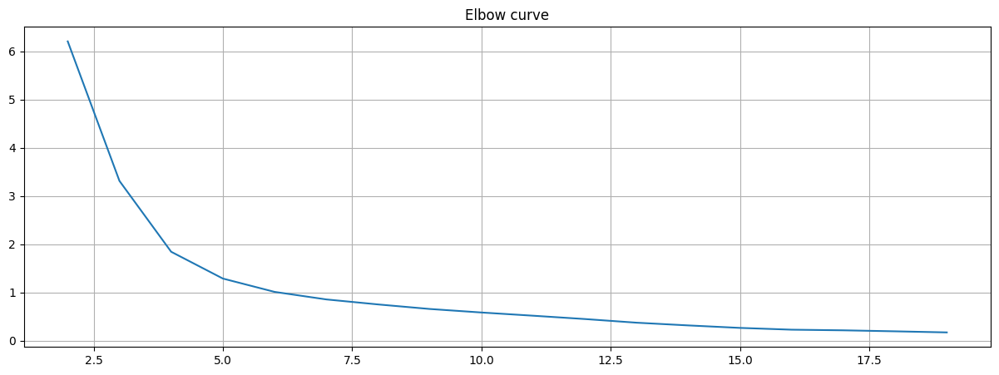

In [ ]:
# Format the data as a numpy array to feed into the K-Means algorithm
data = np.asarray([np.asarray(returns['Returns']),np.asarray(returns['Volatility'])]).T
X = data
distorsions = []
for k in range(2, 20):
    k_means = KMeans(n_clusters=k)
    k_means.fit(X)
    distorsions.append(k_means.inertia_)
fig = plt.figure(figsize=(15, 5))

plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [ ]:
# Computing K-Means with K = 4 (4 clusters)
centroids,_ = kmeans(data,4)

# Assign each sample to a cluster
idx,_ = vq(data,centroids)

# Create a dataframe with the tickers and the clusters that's belong to
details = [(name,cluster) for name, cluster in zip(returns.index,idx)]
details_df = pd.DataFrame(details)

# Rename columns
details_df.columns = ['Ticker','Cluster']

# Create another dataframe with the tickers and data from each stock
clusters_df = returns.reset_index()

# Bring the clusters information from the dataframe 'details_df'
clusters_df['Cluster'] = details_df['Cluster']

# Rename columns
clusters_df.columns = ['Ticker', 'Returns', 'Volatility', 'Cluster']

In [ ]:
# Plot the clusters created using Plotly
fig = px.scatter(clusters_df, x="Returns", y="Volatility", color="Cluster", hover_data=["Ticker"])
fig.update(layout_coloraxis_showscale=False)
fig.show()

## Outlier Removal

In [ ]:
tkr = ["ACES.JK" ,"ADRO.JK" ,"AKRA.JK" ,"ANTM.JK" ,"ASII.JK" ,"BBCA.JK",
       "BBNI.JK" ,"BBRI.JK" ,"BBTN.JK" ,"BMRI.JK" ,"BRPT.JK" ,"BSDE.JK" ,
       "CPIN.JK" ,"EXCL.JK" ,"GGRM.JK" ,"HMSP.JK" ,"ICBP.JK" ,
       "INCO.JK" ,"INDF.JK" ,"INKP.JK" ,"INTP.JK" ,"ITMG.JK" ,"JPFA.JK" ,
       "JSMR.JK" ,"KLBF.JK" ,"MEDC.JK" ,"MNCN.JK" ,
       "PGAS.JK" ,"PTBA.JK" ,"PWON.JK" ,"SMGR.JK" ,"SMRA.JK" ,
       "TINS.JK" ,"TKIM.JK" ,"TLKM.JK" ,"TPIA.JK" ,
       "UNTR.JK" ,"UNVR.JK" ,"WIKA.JK" ,"CTRA.JK" ,"SCMA.JK" ,
       "LPPF.JK" ,"INDY.JK" ,"ADHI.JK" ,"ELSA.JK" ,
       "BKSL.JK" ,"LPKR.JK" ,"BMTR.JK" ,
       "BUMI.JK" ,"MYRX.JK" ,"TRAM.JK" ,"AALI.JK" ,"LSIP.JK" ,
       "ASRI.JK" ,"MPPA.JK" ,"BDMN.JK" ,
       "MAIN.JK" ,"MLPL.JK" ,"SSIA.JK" ,
       "BHIT.JK" ,"BWPT.JK" ,"IMAS.JK" ,"SMCB.JK" ,
       "ENRG.JK" ,"INTA.JK" ,"KIJA.JK" ,"DOID.JK" ,
       "GJTL.JK" ,"UNSP.JK" ,"BNBR.JK" ,
       "ISAT.JK" ,"BBKP.JK" ,"BTEL.JK" ,"DEWA.JK" ,
       "BISI.JK" ,"BLTA.JK" ,"HEXA.JK" ,"MIRA.JK" ,"SGRO.JK",
       "ERAA.JK", "TBIG.JK" , "WSKT.JK", "BJBR.JK", "HRUM.JK",
       "TAXI.JK", "VIVA.JK", "GIAA.JK", "KRAS.JK","SIMP.JK"]
data = yf.download(tkr, start = '2015-01-02', end = '2023-10-27', interval = '1d')
data = data['Adj Close']

[*********************100%%**********************]  89 of 89 completed


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

Text(0.5, 1.0, 'Elbow curve')

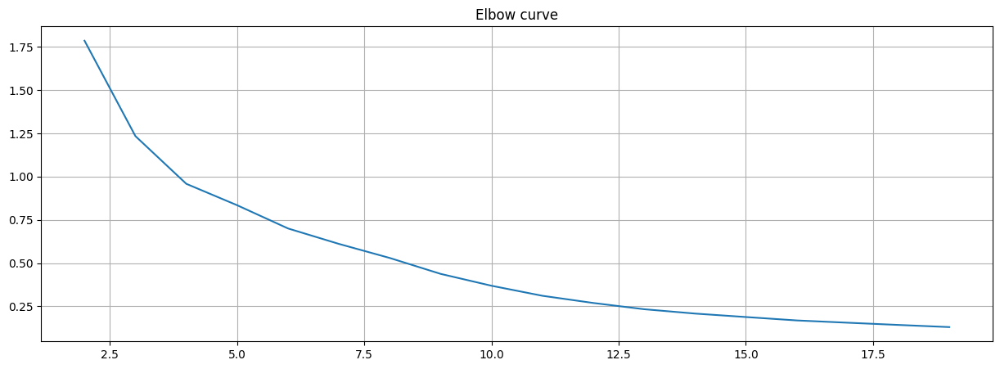

In [ ]:
# Format the data as a numpy array to feed into the K-Means algorithm
data = np.asarray([np.asarray(returns['Returns']),np.asarray(returns['Volatility'])]).T
X = data
distorsions = []
for k in range(2, 20):
    k_means = KMeans(n_clusters=k)
    k_means.fit(X)
    distorsions.append(k_means.inertia_)
fig = plt.figure(figsize=(15, 5))

plt.plot(range(2, 20), distorsions)
plt.grid(True)
plt.title('Elbow curve')

In [ ]:
# Computing K-Means with K = 4 (4 clusters)
centroids,_ = kmeans(data,4)

# Assign each sample to a cluster
idx,_ = vq(data,centroids)

# Create a dataframe with the tickers and the clusters that's belong to
details = [(name,cluster) for name, cluster in zip(returns.index,idx)]
details_df = pd.DataFrame(details)

# Rename columns
details_df.columns = ['Ticker','Cluster']

# Create another dataframe with the tickers and data from each stock
clusters_df = returns.reset_index()

# Bring the clusters information from the dataframe 'details_df'
clusters_df['Cluster'] = details_df['Cluster']

# Rename columns
clusters_df.columns = ['Ticker', 'Returns', 'Volatility', 'Cluster']

In [ ]:
# Plot the clusters created using Plotly
fig = px.scatter(clusters_df, x="Returns", y="Volatility", color="Cluster", hover_data=["Ticker"])
fig.update(layout_coloraxis_showscale=False)
fig.show()